<a href="https://colab.research.google.com/github/Shamyuktha-V/Evolving-Ties-A-Network-Science-Approach-to-Student-Interactions-in-the-COVID-19-Crisis-/blob/main/Student_network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!apt-get install graphviz libgraphviz-dev pkg-config
!pip install pygraphviz

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
pkg-config is already the newest version (0.29.2-1ubuntu3).
graphviz is already the newest version (2.42.2-6ubuntu0.1).
libgraphviz-dev is already the newest version (2.42.2-6ubuntu0.1).
The following packages were automatically installed and are no longer required:
  libbz2-dev libpkgconf3 libreadline-dev
Use 'apt autoremove' to remove them.
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from IPython import get_ipython
from IPython.display import display
from pandas import *
import networkx as nx
import matplotlib.pyplot as plt
import random
import pygraphviz

data = read_csv("/content/drive/MyDrive/SEM 8/RSL LAB/covid_data.csv")

student_names = data["Name"].tolist()
no_of_students = len(student_names)

student_interaction_before_pandemic = data["Your interaction group before the pandemic (Please mention the number)"].tolist()
student_interaction_during_pandemic = data["Your interaction group during the pandemic (Please mention the number)"].tolist()
student_interaction_after_pandemic = data["Your interaction group after the pandemic (Please mention the number)"].tolist()
student_course_of_study = data["Course of Study"].tolist()
student_year_of_study = data["Year of Study"].tolist()
student_gender = data["Gender"].tolist()


for index in range(no_of_students):
    student_names[index] = "Student" + str(index+1)

print("No of students: ", no_of_students)

student_graph_before_covid = nx.Graph()
student_graph_during_covid = nx.Graph()
student_graph_after_covid = nx.Graph()

for index, row in data.iterrows():
    student_name = "Student" + str(index+1)
    properties = row.drop('Name').to_dict()
    student_graph_before_covid.add_node(student_name, **properties)
    student_graph_during_covid.add_node(student_name, **properties)
    student_graph_after_covid.add_node(student_name, **properties)


No of students:  126


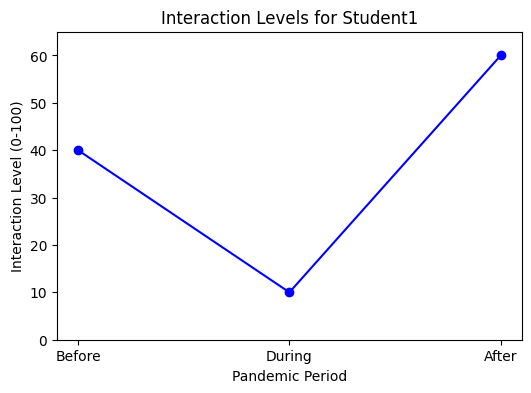

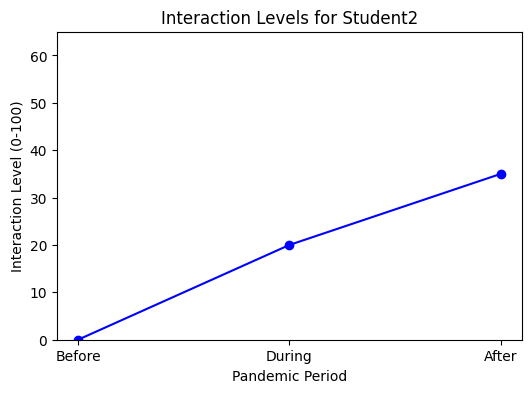

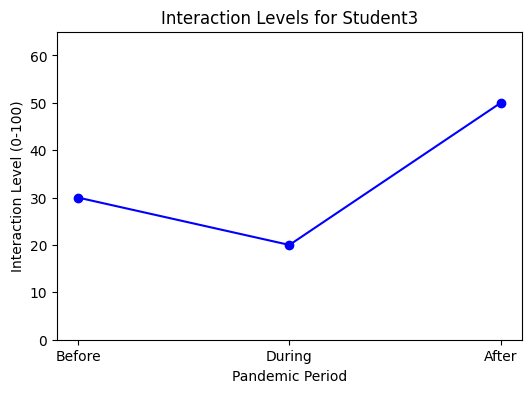

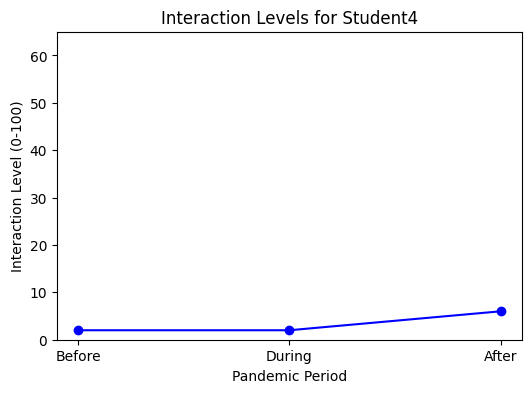

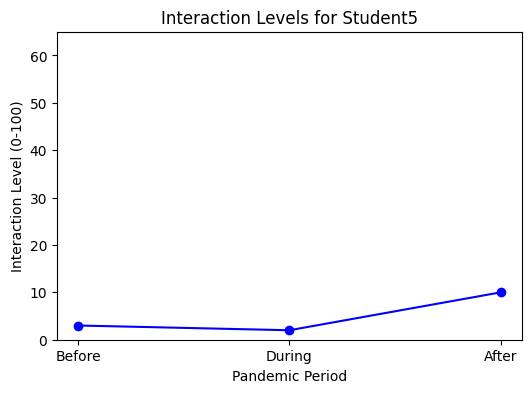

...

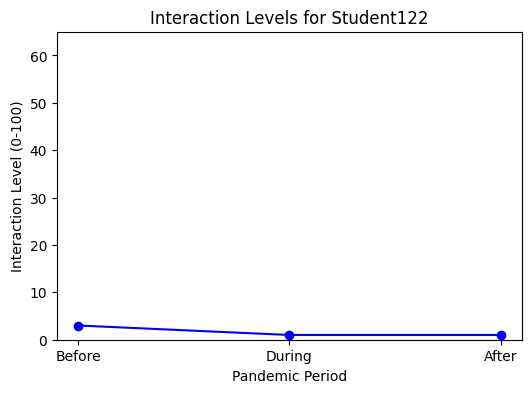

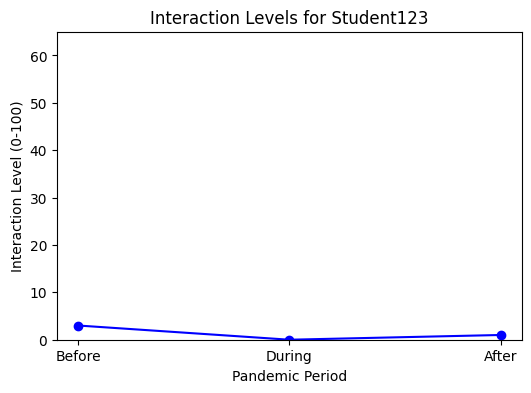

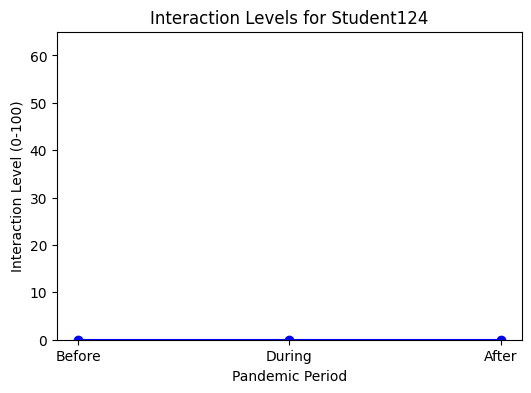

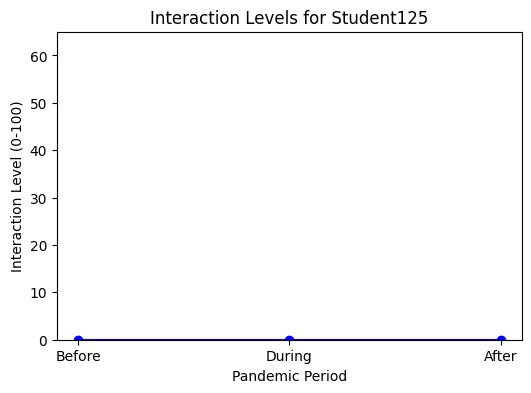

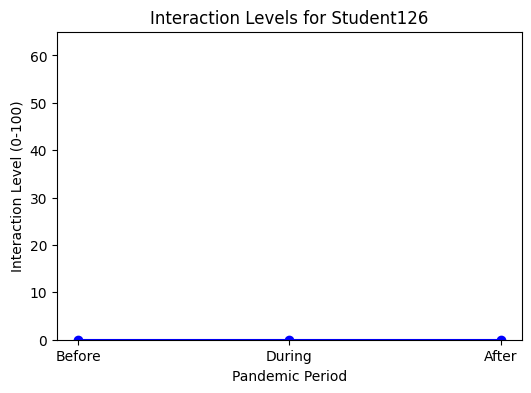

student_interaction_incr_before_during ::  15
student_interaction_dec_before_during ::  79
student_interaction_no_change_before_during ::  32
student_interaction_no_change_during_after ::  27
student_interaction_incr_during_after ::  83
student_interaction_dec_during_after ::  16
student_interact_incr_before_after ::  46
student_interaction_dec_before_after ::  44
student_interaction_no_change_before_after ::  36


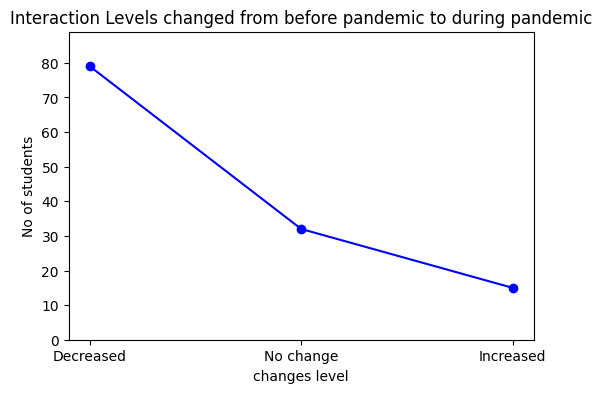

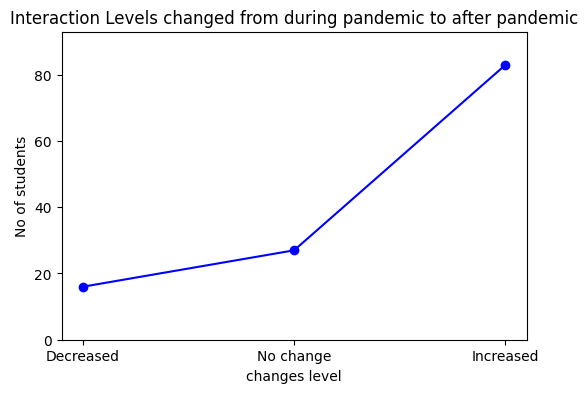

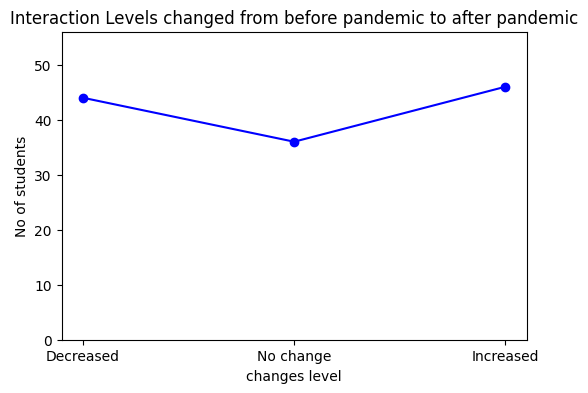

Student interaction in tcs


Before covid to During covid
Increased count -  6
Decreased count -  39
No change count -  16



During covid to After covid
Increased count -  44
Decreased count -  4
No change count -  13



Before covid to After covid
Increased count -  46
Decreased count -  44
No change count -  36



Student interaction in cs


Before covid to During covid
Increased count -  4
Decreased count -  5
No change count -  5



During covid to After covid
Increased count -  6
Decreased count -  3
No change count -  5



Before covid to After covid
Increased count -  6
Decreased count -  4
No change count -  4



Student interaction in ss


Before covid to During covid
Increased count -  3
Decreased count -  26
No change count -  4



During covid to After covid
Increased count -  21
Decreased count -  7
No change count -  5



Before covid to After covid
Increased count -  8
Decreased count -  20
No change count -  5



Student interaction in ds


Before covid to During covid

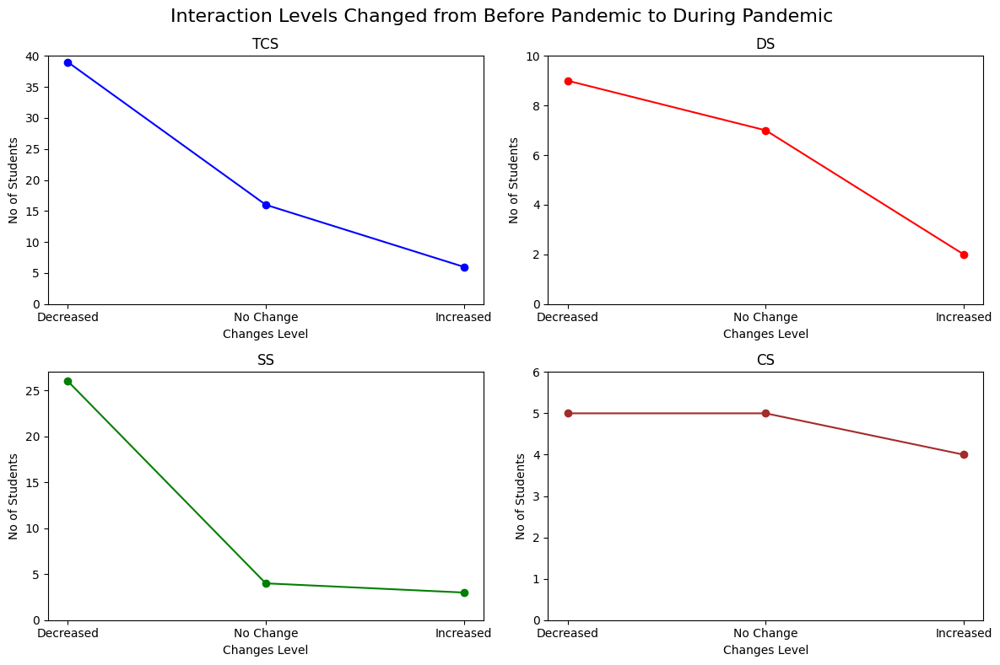

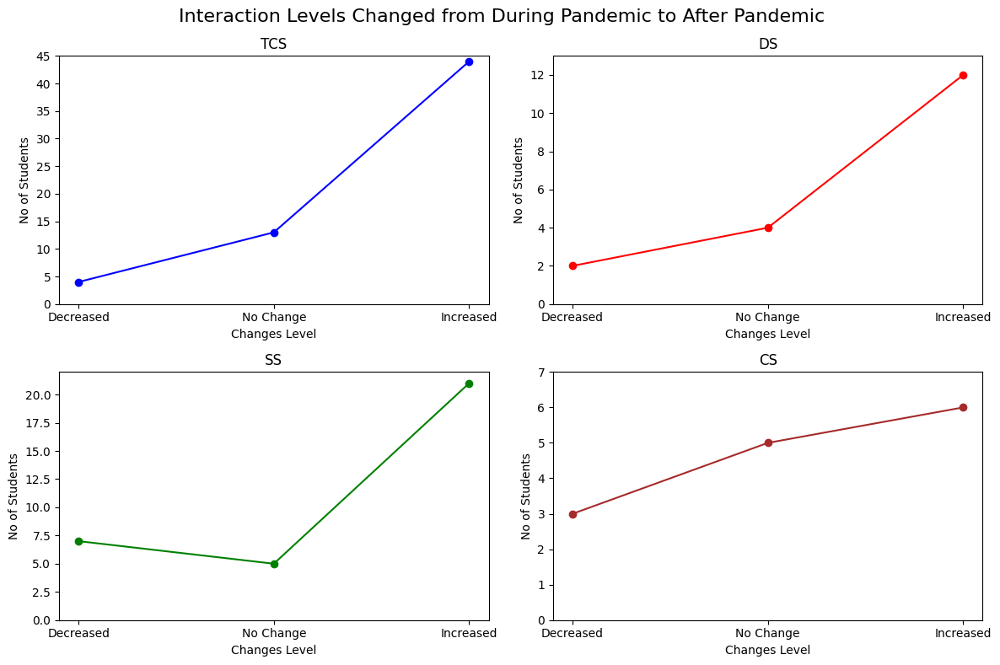

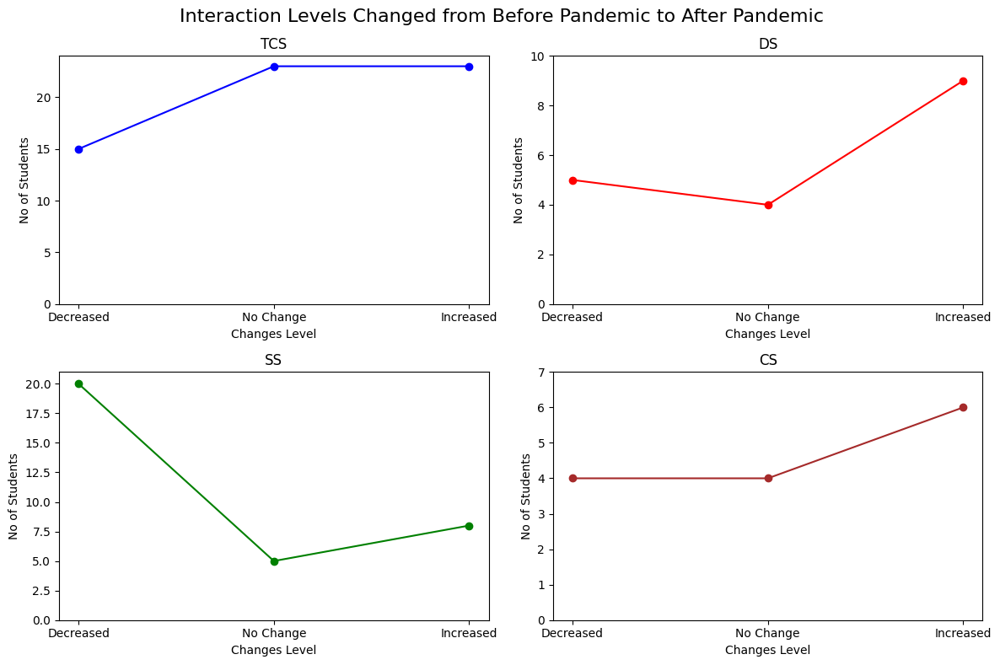

In [ ]:
#plot for each student
student_interaction_incr_before_during = 0
student_interaction_dec_before_during =  0
student_interaction_no_change_before_during = 0
student_interaction_no_change_during_after = 0
student_interaction_incr_during_after = 0
student_interaction_dec_during_after = 0
student_interaction_no_change_before_after = 0
student_interaction_incr_before_after = 0
student_interaction_dec_before_after = 0

for i in range(no_of_students):
    student_name = student_names[i]
    interactions = [student_interaction_before_pandemic[i],
                    student_interaction_during_pandemic[i],
                    student_interaction_after_pandemic[i]]
    x_labels = ['Before', 'During', 'After']

    plt.figure(figsize=(6, 4))
    plt.plot(x_labels, interactions, marker='o', linestyle='-', color='blue')

    plt.title(f"Interaction Levels for {student_name}")
    plt.xlabel("Pandemic Period")
    plt.ylabel("Interaction Level (0-100)")
    plt.ylim(0,65)

    plt.show()

    if interactions[0] < interactions[1]:
        student_interaction_incr_before_during += 1
    elif interactions[0] > interactions[1]:
        student_interaction_dec_before_during += 1
    else:
        student_interaction_no_change_before_during += 1

    if interactions[1] < interactions[2]:
        student_interaction_incr_during_after += 1
    elif interactions[1] > interactions[2]:
        student_interaction_dec_during_after += 1
    else:
        student_interaction_no_change_during_after += 1

    if interactions[0] < interactions[2]:
        student_interaction_incr_before_after += 1
    elif interactions[0] > interactions[2]:
        student_interaction_dec_before_after += 1
    else:
        student_interaction_no_change_before_after += 1

print("student_interaction_incr_before_during :: ", student_interaction_incr_before_during)
print("student_interaction_dec_before_during :: ", student_interaction_dec_before_during)
print("student_interaction_no_change_before_during :: ", student_interaction_no_change_before_during)
print("student_interaction_no_change_during_after :: ", student_interaction_no_change_during_after)
print("student_interaction_incr_during_after :: ", student_interaction_incr_during_after)
print("student_interaction_dec_during_after :: ", student_interaction_dec_during_after)
print("student_interact_incr_before_after :: ", student_interaction_incr_before_after)
print("student_interaction_dec_before_after :: ", student_interaction_dec_before_after)
print("student_interaction_no_change_before_after :: ", student_interaction_no_change_before_after)

x_labels = ['Decreased', 'No change', 'Increased']
changes = [student_interaction_dec_before_during,  student_interaction_no_change_before_during, student_interaction_incr_before_during]
plt.figure(figsize=(6, 4))
plt.plot(x_labels, changes, marker='o', linestyle='-', color='blue')

plt.title(f"Interaction Levels changed from before pandemic to during pandemic")
plt.xlabel("changes level")
plt.ylabel("No of students")
plt.ylim(0,max(changes)+10)

plt.show()

x_labels = [ 'Decreased', 'No change', 'Increased']
changes = [student_interaction_dec_during_after, student_interaction_no_change_during_after, student_interaction_incr_during_after]
plt.figure(figsize=(6, 4))
plt.plot(x_labels, changes, marker='o', linestyle='-', color='blue')

plt.title(f"Interaction Levels changed from during pandemic to after pandemic")
plt.xlabel("changes level")
plt.ylabel("No of students")
plt.ylim(0,max(changes)+10)

plt.show()

x_labels = ['Decreased', 'No change', 'Increased']
changes = [student_interaction_dec_before_after, student_interaction_no_change_before_after, student_interaction_incr_before_after]
plt.figure(figsize=(6, 4))
plt.plot(x_labels, changes, marker='o', linestyle='-', color='blue')

plt.title(f"Interaction Levels changed from before pandemic to after pandemic")
plt.xlabel("changes level")
plt.ylabel("No of students")
plt.ylim(0,max(changes)+10)

plt.show()

#for tcs
student_interaction_incr_before_during_tcs = 0
student_interaction_dec_before_during_tcs =  0
student_interaction_no_change_before_during_tcs = 0
student_interaction_no_change_during_after_tcs = 0
student_interaction_incr_during_after_tcs = 0
student_interaction_dec_during_after_tcs = 0
student_interaction_no_change_before_after_tcs = 0
student_interaction_incr_before_after_tcs = 0
student_interaction_dec_before_after_tcs = 0

#for cs
student_interaction_incr_before_during_cs = 0
student_interaction_dec_before_during_cs =  0
student_interaction_no_change_before_during_cs = 0
student_interaction_no_change_during_after_cs = 0
student_interaction_incr_during_after_cs = 0
student_interaction_dec_during_after_cs = 0
student_interaction_no_change_before_after_cs = 0
student_interaction_incr_before_after_cs = 0
student_interaction_dec_before_after_cs = 0

#for ss
student_interaction_incr_before_during_ss = 0
student_interaction_dec_before_during_ss =  0
student_interaction_no_change_before_during_ss = 0
student_interaction_no_change_during_after_ss = 0
student_interaction_incr_during_after_ss = 0
student_interaction_dec_during_after_ss = 0
student_interaction_no_change_before_after_ss = 0
student_interaction_incr_before_after_ss = 0
student_interaction_dec_before_after_ss = 0

#for ds
student_interaction_incr_before_during_ds = 0
student_interaction_dec_before_during_ds =  0
student_interaction_no_change_before_during_ds = 0
student_interaction_no_change_during_after_ds = 0
student_interaction_incr_during_after_ds = 0
student_interaction_dec_during_after_ds = 0
student_interaction_no_change_before_after_ds = 0
student_interaction_incr_before_after_ds = 0
student_interaction_dec_before_after_ds = 0



for i in range(no_of_students):
    student_name = student_names[i]
    interactions = [student_interaction_before_pandemic[i],
                    student_interaction_during_pandemic[i],
                    student_interaction_after_pandemic[i]]
    if student_course_of_study[i] == "MSc Theoretical Computer Science":

        if interactions[0] < interactions[1]:
            student_interaction_incr_before_during_tcs += 1
        elif interactions[0] > interactions[1]:
            student_interaction_dec_before_during_tcs += 1
        else:
            student_interaction_no_change_before_during_tcs += 1

        if interactions[1] < interactions[2]:
            student_interaction_incr_during_after_tcs += 1
        elif interactions[1] > interactions[2]:
            student_interaction_dec_during_after_tcs += 1
        else:
            student_interaction_no_change_during_after_tcs += 1

        if interactions[0] < interactions[2]:
            student_interaction_incr_before_after_tcs += 1
        elif interactions[0] > interactions[2]:
            student_interaction_dec_before_after_tcs += 1
        else:
            student_interaction_no_change_before_after_tcs += 1


    elif student_course_of_study[i] == "MSc Data Science":

        if interactions[0] < interactions[1]:
            student_interaction_incr_before_during_ds += 1
        elif interactions[0] > interactions[1]:
            student_interaction_dec_before_during_ds += 1
        else:
            student_interaction_no_change_before_during_ds += 1

        if interactions[1] < interactions[2]:
            student_interaction_incr_during_after_ds += 1
        elif interactions[1] > interactions[2]:
            student_interaction_dec_during_after_ds += 1
        else:
            student_interaction_no_change_during_after_ds += 1

        if interactions[0] < interactions[2]:
            student_interaction_incr_before_after_ds += 1
        elif interactions[0] > interactions[2]:
            student_interaction_dec_before_after_ds += 1
        else:
            student_interaction_no_change_before_after_ds += 1

    elif student_course_of_study[i] == "MSc Software Systems":

        if interactions[0] < interactions[1]:
            student_interaction_incr_before_during_ss += 1
        elif interactions[0] > interactions[1]:
            student_interaction_dec_before_during_ss += 1
        else:
            student_interaction_no_change_before_during_ss += 1

        if interactions[1] < interactions[2]:
            student_interaction_incr_during_after_ss += 1
        elif interactions[1] > interactions[2]:
            student_interaction_dec_during_after_ss += 1
        else:
            student_interaction_no_change_during_after_ss += 1

        if interactions[0] < interactions[2]:
            student_interaction_incr_before_after_ss += 1
        elif interactions[0] > interactions[2]:
            student_interaction_dec_before_after_ss += 1
        else:
            student_interaction_no_change_before_after_ss += 1

    else:

        if interactions[0] < interactions[1]:
            student_interaction_incr_before_during_cs += 1
        elif interactions[0] > interactions[1]:
            student_interaction_dec_before_during_cs += 1
        else:
            student_interaction_no_change_before_during_cs += 1

        if interactions[1] < interactions[2]:
            student_interaction_incr_during_after_cs += 1
        elif interactions[1] > interactions[2]:
            student_interaction_dec_during_after_cs += 1
        else:
            student_interaction_no_change_during_after_cs += 1

        if interactions[0] < interactions[2]:
            student_interaction_incr_before_after_cs += 1
        elif interactions[0] > interactions[2]:
            student_interaction_dec_before_after_cs += 1
        else:
            student_interaction_no_change_before_after_cs += 1

print("Student interaction in tcs\n\n")

print("Before covid to During covid")
print("Increased count - ", student_interaction_incr_before_during_tcs)
print("Decreased count - ", student_interaction_dec_before_during_tcs)
print("No change count - ", student_interaction_no_change_before_during_tcs)
print("\n\n")

print("During covid to After covid")
print("Increased count - ", student_interaction_incr_during_after_tcs)
print("Decreased count - ", student_interaction_dec_during_after_tcs)
print("No change count - ", student_interaction_no_change_during_after_tcs)
print("\n\n")

print("Before covid to After covid")
print("Increased count - ", student_interaction_incr_before_after)
print("Decreased count - ", student_interaction_dec_before_after)
print("No change count - ", student_interaction_no_change_before_after)
print("\n\n")


print("Student interaction in cs\n\n")

print("Before covid to During covid")
print("Increased count - ", student_interaction_incr_before_during_cs)
print("Decreased count - ", student_interaction_dec_before_during_cs)
print("No change count - ", student_interaction_no_change_before_during_cs)
print("\n\n")

print("During covid to After covid")
print("Increased count - ", student_interaction_incr_during_after_cs)
print("Decreased count - ", student_interaction_dec_during_after_cs)
print("No change count - ", student_interaction_no_change_during_after_cs)
print("\n\n")

print("Before covid to After covid")
print("Increased count - ", student_interaction_incr_before_after_cs)
print("Decreased count - ", student_interaction_dec_before_after_cs)
print("No change count - ", student_interaction_no_change_before_after_cs)
print("\n\n")

print("Student interaction in ss\n\n")

print("Before covid to During covid")
print("Increased count - ", student_interaction_incr_before_during_ss)
print("Decreased count - ", student_interaction_dec_before_during_ss)
print("No change count - ", student_interaction_no_change_before_during_ss)
print("\n\n")

print("During covid to After covid")
print("Increased count - ", student_interaction_incr_during_after_ss)
print("Decreased count - ", student_interaction_dec_during_after_ss)
print("No change count - ", student_interaction_no_change_during_after_ss)
print("\n\n")

print("Before covid to After covid")
print("Increased count - ", student_interaction_incr_before_after_ss)
print("Decreased count - ", student_interaction_dec_before_after_ss)
print("No change count - ", student_interaction_no_change_before_after_ss)
print("\n\n")

print("Student interaction in ds\n\n")

print("Before covid to During covid")
print("Increased count - ", student_interaction_incr_before_during_ds)
print("Decreased count - ", student_interaction_dec_before_during_ds)
print("No change count - ", student_interaction_no_change_before_during_ds)
print("\n\n")

print("During covid to After covid")
print("Increased count - ", student_interaction_incr_during_after_ds)
print("Decreased count - ", student_interaction_dec_during_after_ds)
print("No change count - ", student_interaction_no_change_during_after_ds)
print("\n\n")

print("Before covid to After covid")
print("Increased count - ", student_interaction_incr_before_after_ds)
print("Decreased count - ", student_interaction_dec_before_after_ds)
print("No change count - ", student_interaction_no_change_before_after_ds)
print("\n\n")

x_labels = ["Decreased", "No Change", "Increased"]
changes_tcs = [student_interaction_dec_before_during_tcs, student_interaction_no_change_before_during_tcs, student_interaction_incr_before_during_tcs]
changes_ds = [student_interaction_dec_before_during_ds, student_interaction_no_change_before_during_ds, student_interaction_incr_before_during_ds]
changes_cs = [student_interaction_dec_before_during_cs, student_interaction_no_change_before_during_cs, student_interaction_incr_before_during_cs]
changes_ss = [student_interaction_dec_before_during_ss, student_interaction_no_change_before_during_ss, student_interaction_incr_before_during_ss]

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Plot for TCS
axes[0, 0].plot(x_labels, changes_tcs, marker='o', linestyle='-', color='blue')
axes[0, 0].set_title("TCS")
axes[0, 0].set_xlabel("Changes Level")
axes[0, 0].set_ylabel("No of Students")
axes[0, 0].set_ylim(0, max(changes_tcs)+1)

# Plot for DS
axes[0, 1].plot(x_labels, changes_ds, marker='o', linestyle='-', color='red')
axes[0, 1].set_title("DS")
axes[0, 1].set_xlabel("Changes Level")
axes[0, 1].set_ylabel("No of Students")
axes[0, 1].set_ylim(0, max(changes_ds)+1)

# Plot for SS
axes[1, 0].plot(x_labels, changes_ss, marker='o', linestyle='-', color='green')
axes[1, 0].set_title("SS")
axes[1, 0].set_xlabel("Changes Level")
axes[1, 0].set_ylabel("No of Students")
axes[1, 0].set_ylim(0, max(changes_ss)+1)

# Plot for CS
axes[1, 1].plot(x_labels, changes_cs, marker='o', linestyle='-', color='brown')
axes[1, 1].set_title("CS")
axes[1, 1].set_xlabel("Changes Level")
axes[1, 1].set_ylabel("No of Students")
axes[1, 1].set_ylim(0, max(changes_cs)+1)


fig.suptitle("Interaction Levels Changed from Before Pandemic to During Pandemic", fontsize=16)
plt.tight_layout()
plt.show()

x_labels = ["Decreased", "No Change", "Increased"]
changes_tcs = [student_interaction_dec_during_after_tcs, student_interaction_no_change_during_after_tcs, student_interaction_incr_during_after_tcs]
changes_cs = [student_interaction_dec_during_after_cs, student_interaction_no_change_during_after_cs, student_interaction_incr_during_after_cs]
changes_ds = [student_interaction_dec_during_after_ds, student_interaction_no_change_during_after_ds, student_interaction_incr_during_after_ds]
changes_ss = [student_interaction_dec_during_after_ss, student_interaction_no_change_during_after_ss, student_interaction_incr_during_after_ss]

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Plot for TCS
axes[0, 0].plot(x_labels, changes_tcs, marker='o', linestyle='-', color='blue')
axes[0, 0].set_title("TCS")
axes[0, 0].set_xlabel("Changes Level")
axes[0, 0].set_ylabel("No of Students")
axes[0, 0].set_ylim(0, max(changes_tcs)+1)

# Plot for DS
axes[0, 1].plot(x_labels, changes_ds, marker='o', linestyle='-', color='red')
axes[0, 1].set_title("DS")
axes[0, 1].set_xlabel("Changes Level")
axes[0, 1].set_ylabel("No of Students")
axes[0, 1].set_ylim(0, max(changes_ds)+1)

# Plot for SS
axes[1, 0].plot(x_labels, changes_ss, marker='o', linestyle='-', color='green')
axes[1, 0].set_title("SS")
axes[1, 0].set_xlabel("Changes Level")
axes[1, 0].set_ylabel("No of Students")
axes[1, 0].set_ylim(0, max(changes_ss)+1)

# Plot for CS
axes[1, 1].plot(x_labels, changes_cs, marker='o', linestyle='-', color='brown')
axes[1, 1].set_title("CS")
axes[1, 1].set_xlabel("Changes Level")
axes[1, 1].set_ylabel("No of Students")
axes[1, 1].set_ylim(0, max(changes_cs)+1)


fig.suptitle("Interaction Levels Changed from During Pandemic to After Pandemic", fontsize=16)
plt.tight_layout()
plt.show()

x_labels = ["Decreased", "No Change", "Increased"]
changes_tcs = [student_interaction_dec_before_after_tcs, student_interaction_no_change_before_after_tcs, student_interaction_incr_before_after_tcs]
changes_ds = [student_interaction_dec_before_after_ds, student_interaction_no_change_before_after_ds, student_interaction_incr_before_after_ds]
changes_cs = [student_interaction_dec_before_after_cs, student_interaction_no_change_before_after_cs, student_interaction_incr_before_after_cs]
changes_ss = [student_interaction_dec_before_after_ss, student_interaction_no_change_before_after_ss, student_interaction_incr_before_after_ss]

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Plot for TCS
axes[0, 0].plot(x_labels, changes_tcs, marker='o', linestyle='-', color='blue')
axes[0, 0].set_title("TCS")
axes[0, 0].set_xlabel("Changes Level")
axes[0, 0].set_ylabel("No of Students")
axes[0, 0].set_ylim(0, max(changes_tcs)+1)

# Plot for DS
axes[0, 1].plot(x_labels, changes_ds, marker='o', linestyle='-', color='red')
axes[0, 1].set_title("DS")
axes[0, 1].set_xlabel("Changes Level")
axes[0, 1].set_ylabel("No of Students")
axes[0, 1].set_ylim(0, max(changes_ds)+1)

# Plot for SS
axes[1, 0].plot(x_labels, changes_ss, marker='o', linestyle='-', color='green')
axes[1, 0].set_title("SS")
axes[1, 0].set_xlabel("Changes Level")
axes[1, 0].set_ylabel("No of Students")
axes[1, 0].set_ylim(0, max(changes_ss)+1)

# Plot for CS
axes[1, 1].plot(x_labels, changes_cs, marker='o', linestyle='-', color='brown')
axes[1, 1].set_title("CS")
axes[1, 1].set_xlabel("Changes Level")
axes[1, 1].set_ylabel("No of Students")
axes[1, 1].set_ylim(0, max(changes_cs)+1)


fig.suptitle("Interaction Levels Changed from Before Pandemic to After Pandemic", fontsize=16)
plt.tight_layout()
plt.show()


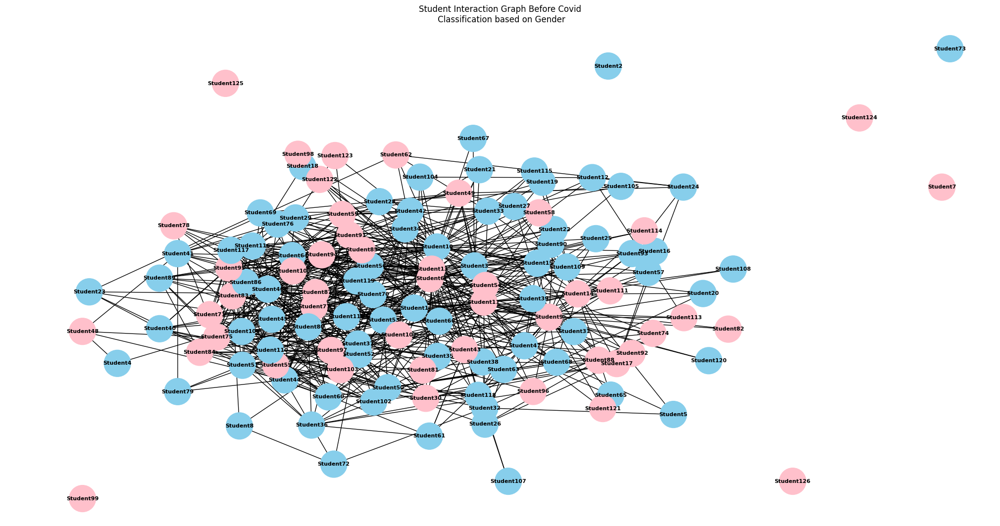

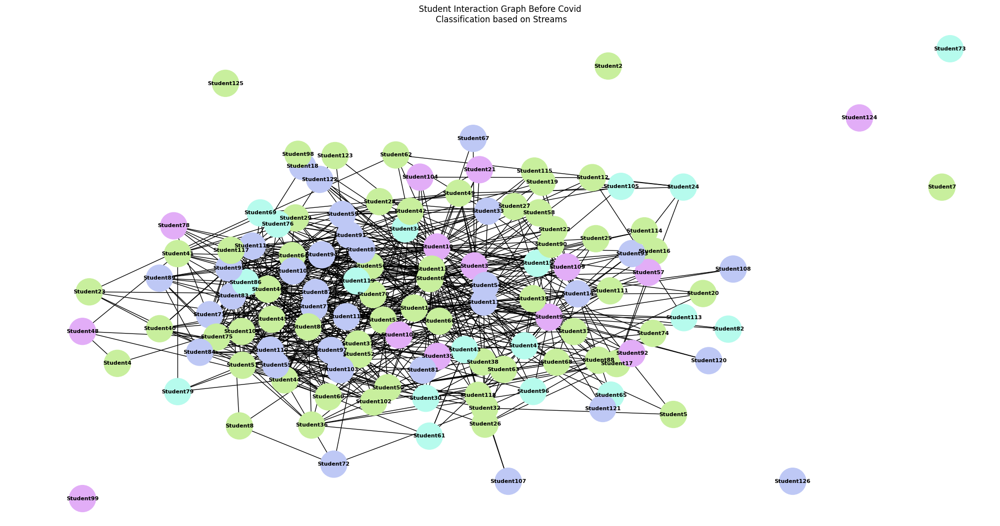

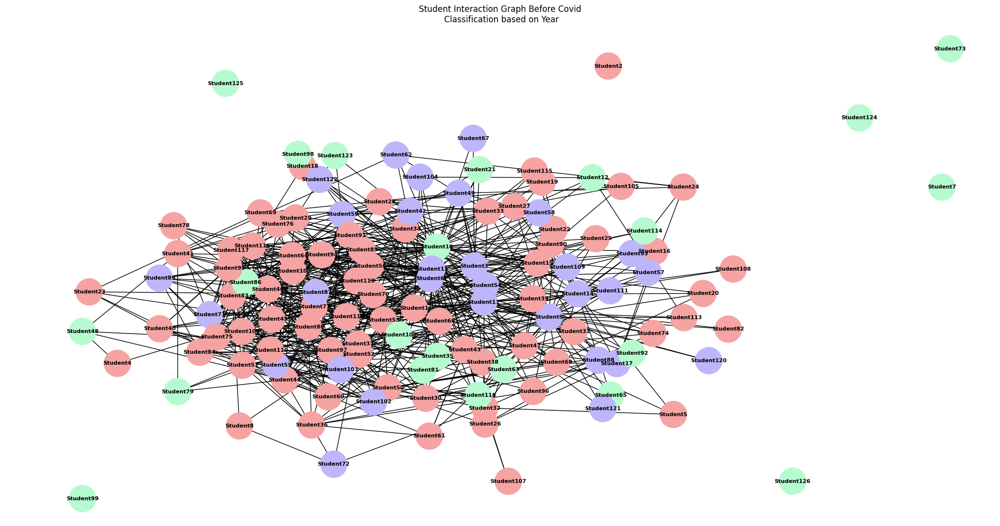

In [ ]:
#before covid

for i in range(no_of_students-1):
  choice_array = [no for no in range(i+1, no_of_students)]
  while student_interaction_before_pandemic[i] > 0:
    random_number = random.choice(choice_array)
    while student_interaction_before_pandemic[random_number]==0:
      choice_array.remove(random_number)
      if len(choice_array) == 0:
        break
      random_number = random.choice(choice_array)
    if len(choice_array) == 0:
        break
    if not student_graph_before_covid.has_edge(student_names[i], student_names[random_number]):
        student_graph_before_covid.add_edge(student_names[i], student_names[random_number])
        student_interaction_before_pandemic[random_number]-=1
        student_interaction_before_pandemic[i]-=1
        choice_array.remove(random_number)
        if len(choice_array) == 0:
          break
    else:
      choice_array.remove(random_number)
      if len(choice_array) == 0:
        break

color_mapping = {'Male': 'skyblue', 'Female': 'pink', 'Prefer not to say': 'grey'}
node_colors = [color_mapping[student_graph_before_covid.nodes[node]['Gender']] for node in student_graph_before_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_before_covid, prog="neato")
nx.draw(student_graph_before_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph Before Covid\n Classification based on Gender")
plt.show()

color_mapping = {'MSc Theoretical Computer Science': '#c8ef9d', 'MSc Data Science': '#b6fbed', 'MSc Cyber Security': '#e2adf7', 'MSc Software Systems':'#bec8f5'}
node_colors = [color_mapping[student_graph_before_covid.nodes[node]['Course of Study']] for node in student_graph_before_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_before_covid, prog="neato")
nx.draw(student_graph_before_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph Before Covid\n Classification based on Streams")
plt.show()

color_mapping = {'2020-25': '#b6fbcf', '2021-26': '#beb6fb', '2019-24': '#f5a3a3', '':'f5eca3'}
node_colors = [color_mapping[student_graph_before_covid.nodes[node]['Year of Study']] for node in student_graph_before_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_before_covid, prog="neato")
nx.draw(student_graph_before_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph Before Covid\n Classification based on Year")
plt.show()



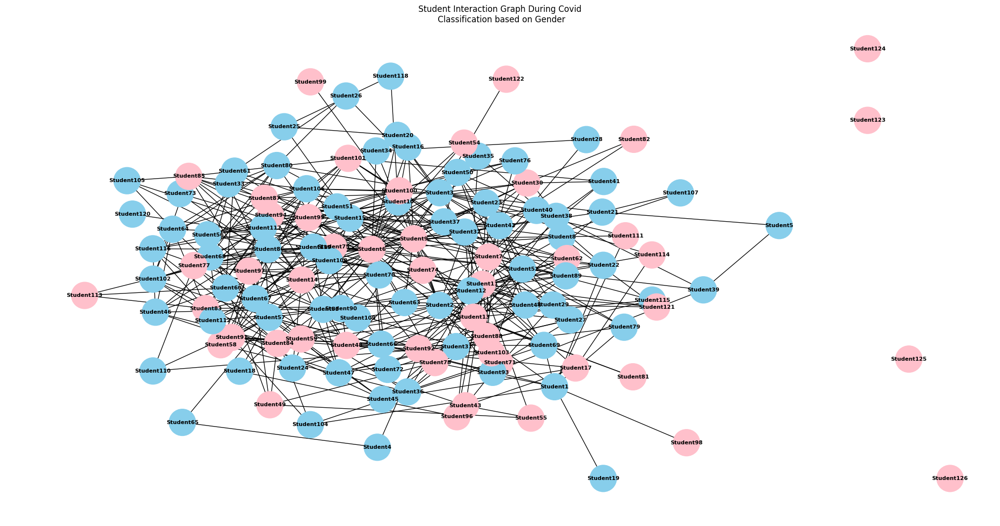

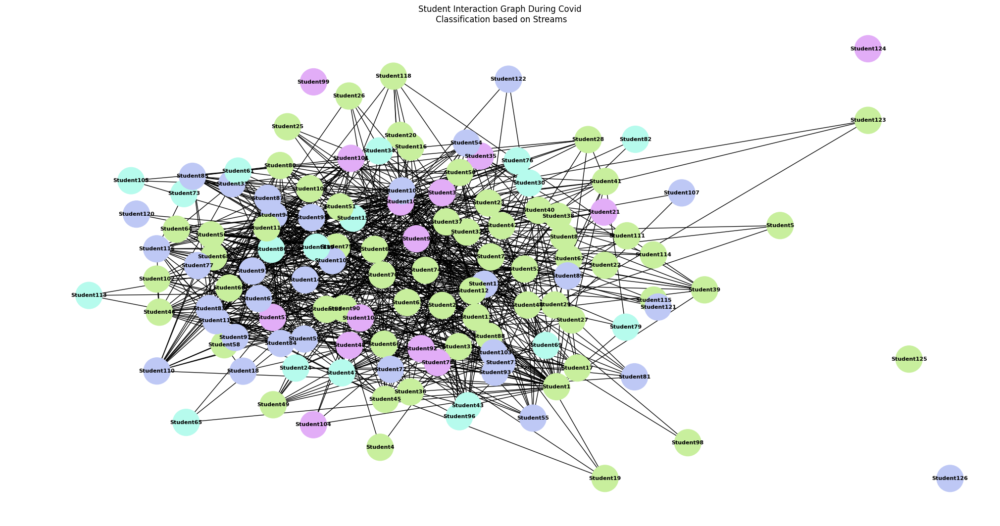

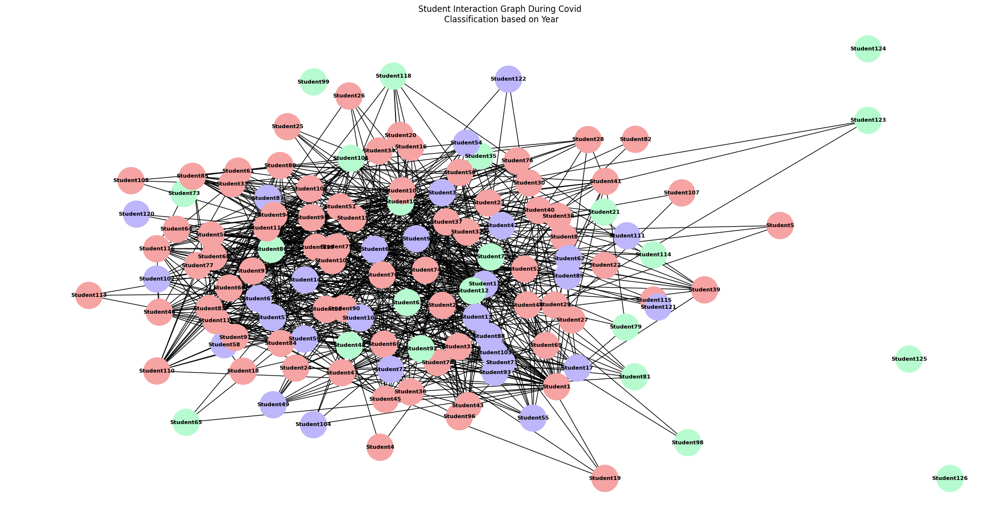

In [ ]:
#during covid

for i in range(no_of_students-1):
  choice_array = [no for no in range(i+1, no_of_students)]
  while student_interaction_during_pandemic[i] > 0:
    random_number = random.choice(choice_array)
    while student_interaction_during_pandemic[random_number]==0:
      choice_array.remove(random_number)
      if len(choice_array) == 0:
        break
      random_number = random.choice(choice_array)
    if len(choice_array) == 0:
        break
    if not student_graph_during_covid.has_edge(student_names[i], student_names[random_number]):
        student_graph_during_covid.add_edge(student_names[i], student_names[random_number])
        student_interaction_during_pandemic[random_number]-=1
        student_interaction_during_pandemic[i]-=1
        choice_array.remove(random_number)
        if len(choice_array) == 0:
          break
    else:
      choice_array.remove(random_number)
      if len(choice_array) == 0:
        break

color_mapping = {'Male': 'skyblue', 'Female': 'pink', 'Prefer not to say': 'grey'}
node_colors = [color_mapping[student_graph_before_covid.nodes[node]['Gender']] for node in student_graph_during_covid.nodes]


plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_during_covid, prog="neato")
nx.draw(student_graph_during_covid, pos=pos, with_labels=True, node_size=1500, node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph During Covid\n Classification based on Gender")
plt.show()

color_mapping = {'MSc Theoretical Computer Science': '#c8ef9d', 'MSc Data Science': '#b6fbed', 'MSc Cyber Security': '#e2adf7', 'MSc Software Systems':'#bec8f5'}
node_colors = [color_mapping[student_graph_during_covid.nodes[node]['Course of Study']] for node in student_graph_before_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_during_covid, prog="neato")
nx.draw(student_graph_before_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph During Covid\n Classification based on Streams")
plt.show()

color_mapping = {'2020-25': '#b6fbcf', '2021-26': '#beb6fb', '2019-24': '#f5a3a3', '':'f5eca3'}
node_colors = [color_mapping[student_graph_during_covid.nodes[node]['Year of Study']] for node in student_graph_before_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_during_covid, prog="neato")
nx.draw(student_graph_before_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph During Covid\n Classification based on Year")
plt.show()



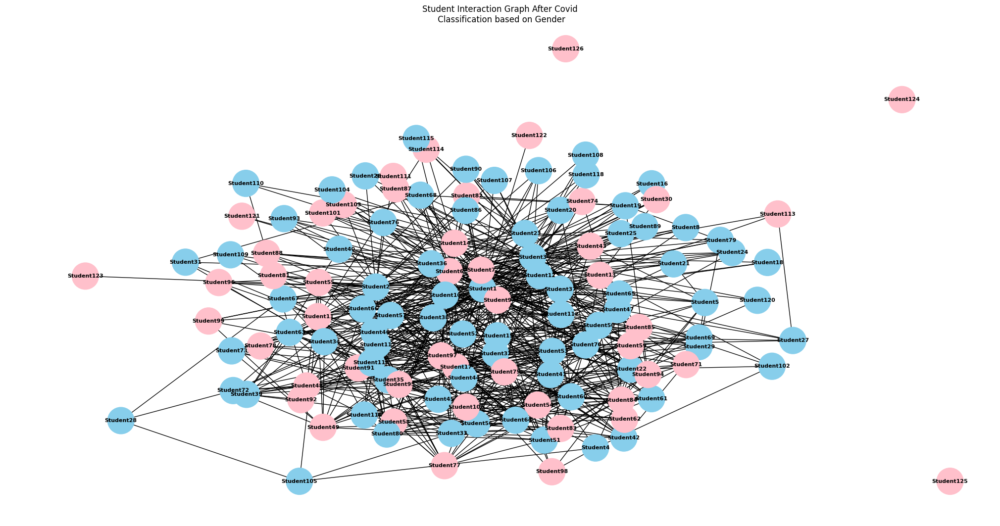

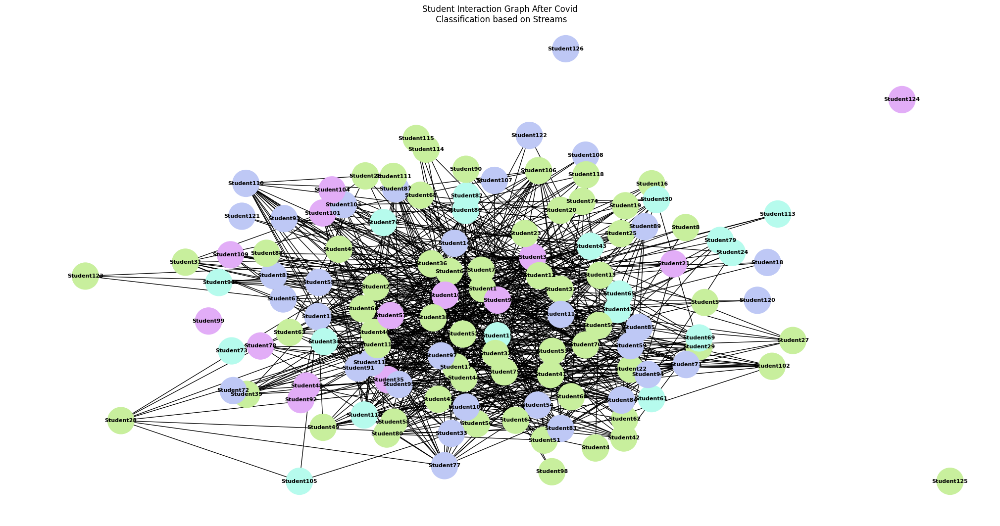

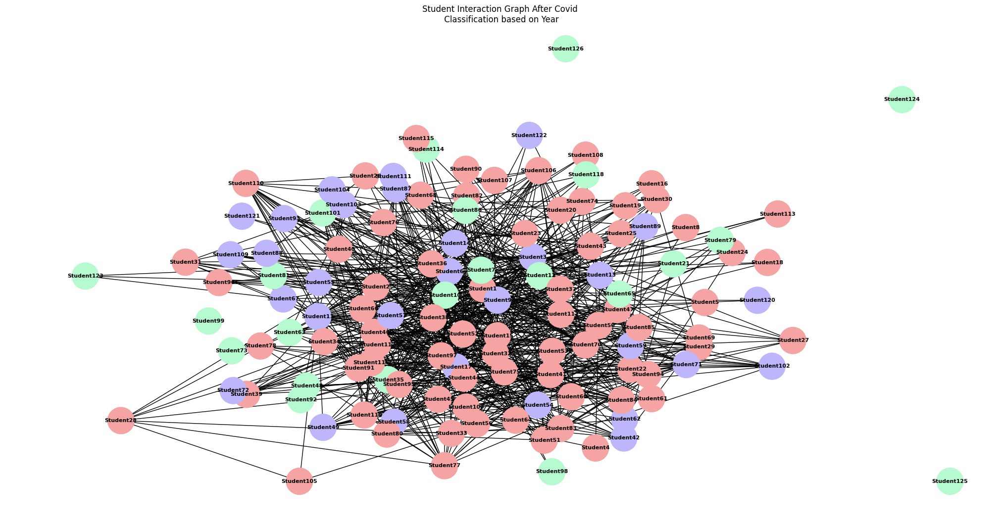

In [ ]:
#after covid

for i in range(no_of_students-1):
  choice_array = [no for no in range(i+1, no_of_students)]
  while student_interaction_after_pandemic[i] > 0:
    random_number = random.choice(choice_array)
    while student_interaction_after_pandemic[random_number]==0:
      choice_array.remove(random_number)
      if len(choice_array) == 0:
        break
      random_number = random.choice(choice_array)
    if len(choice_array) == 0:
        break
    if not student_graph_after_covid.has_edge(student_names[i], student_names[random_number]):
        student_graph_after_covid.add_edge(student_names[i], student_names[random_number])
        student_interaction_after_pandemic[random_number]-=1
        student_interaction_after_pandemic[i]-=1
        choice_array.remove(random_number)
        if len(choice_array) == 0:
          break
    else:
      choice_array.remove(random_number)
      if len(choice_array) == 0:
        break

color_mapping = {'Male': 'skyblue', 'Female': 'pink', 'Prefer not to say': 'grey'}
node_colors = [color_mapping[student_graph_before_covid.nodes[node]['Gender']] for node in student_graph_after_covid.nodes]
plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_after_covid, prog="neato")
nx.draw(student_graph_after_covid, pos=pos, with_labels=True, node_size=1500, node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph After Covid\n Classification based on Gender")
plt.show()

color_mapping = {'MSc Theoretical Computer Science': '#c8ef9d', 'MSc Data Science': '#b6fbed', 'MSc Cyber Security': '#e2adf7', 'MSc Software Systems':'#bec8f5'}
node_colors = [color_mapping[student_graph_after_covid.nodes[node]['Course of Study']] for node in student_graph_before_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_after_covid, prog="neato")
nx.draw(student_graph_before_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph After Covid\n Classification based on Streams")
plt.show()

color_mapping = {'2020-25': '#b6fbcf', '2021-26': '#beb6fb', '2019-24': '#f5a3a3', '':'f5eca3'}
node_colors = [color_mapping[student_graph_after_covid.nodes[node]['Year of Study']] for node in student_graph_before_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_after_covid, prog="neato")
nx.draw(student_graph_before_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph After Covid\n Classification based on Year")
plt.show()



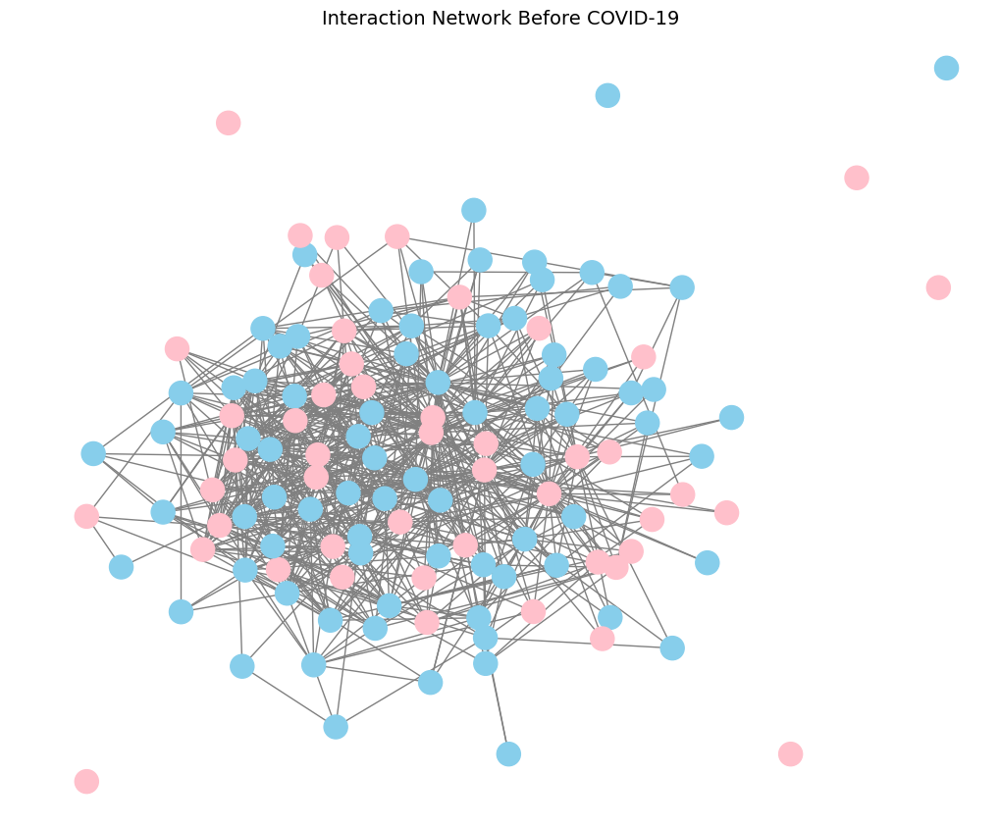

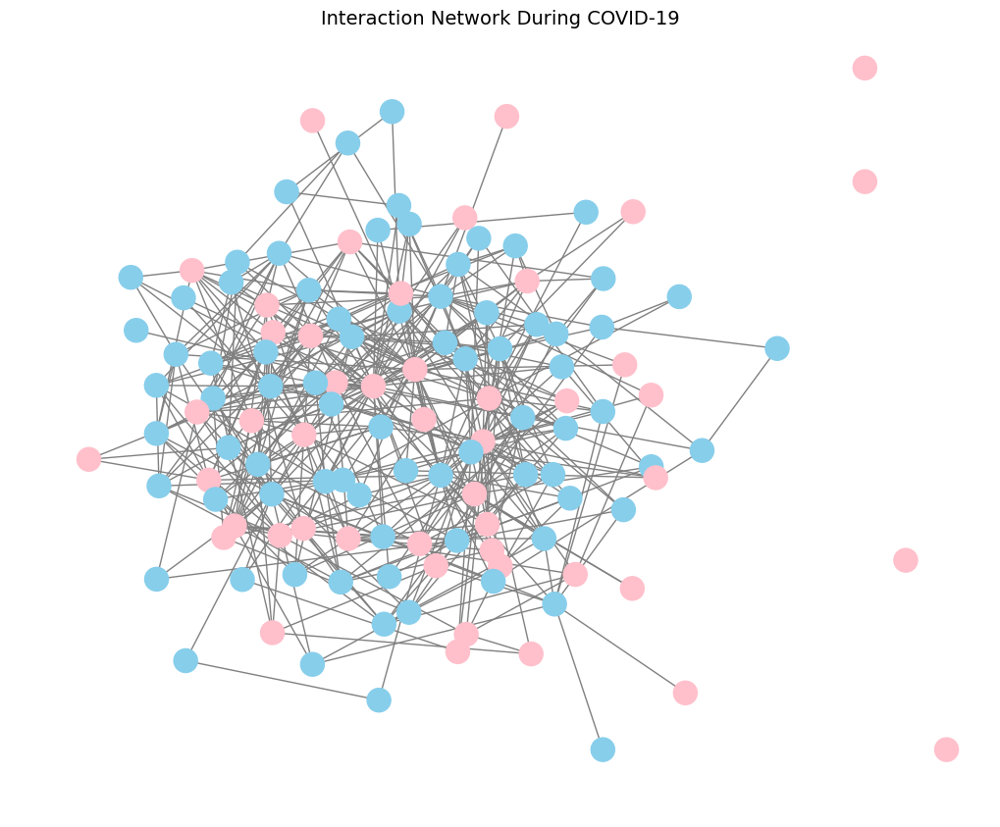

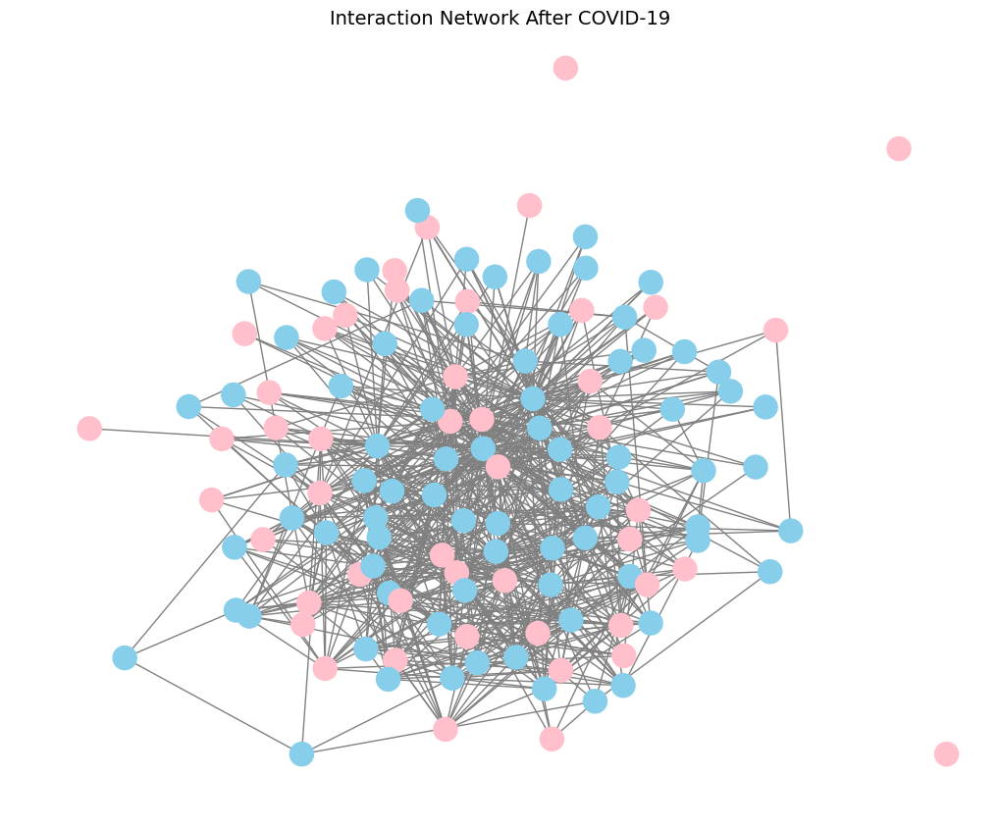

In [ ]:
# Import required libraries (already imported in your code, but listed for completeness)
import networkx as nx
import matplotlib.pyplot as plt
import pygraphviz
from networkx.drawing.nx_agraph import graphviz_layout

# Define a color mapping for gender
gender_colors = {'Male': 'skyblue', 'Female': 'pink'}

# Function to visualize and save a graph
def visualize_graph(graph, title, filename):
    plt.figure(figsize=(10, 8))  # Set figure size
    # Generate layout using neato program from PyGraphviz
    pos = graphviz_layout(graph, prog='neato')

    # Get node colors based on gender
    node_colors = [gender_colors[graph.nodes[node]['Gender']] for node in graph.nodes()]

    # Draw the graph
    nx.draw(graph, pos, node_color=node_colors, with_labels=False, node_size=300, edge_color='gray')

    # Add a title
    plt.title(title, fontsize=14)

    # Save the figure
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Visualize the three graphs
visualize_graph(student_graph_before_covid, "Interaction Network Before COVID-19", "before_covid_network.png")
visualize_graph(student_graph_during_covid, "Interaction Network During COVID-19", "during_covid_network.png")
visualize_graph(student_graph_after_covid, "Interaction Network After COVID-19", "after_covid_network.png")

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Extract relevant features for clustering
features = data[['Gender', 'Course of Study', 'Year of Study']]

# Convert categorical features to numerical using Label Encoding
encoder = LabelEncoder()
for column in features.columns:
    if features[column].dtype == 'object':  # Check if the column is categorical
        features[column] = encoder.fit_transform(features[column])

# Create a dictionary mapping student names to feature vectors
feature_dict = {}
for index, row in features.iterrows():
    student_name = "Student" + str(index+1)
    feature_dict[student_name] = row.values

<ipython-input-14-3fac9a7b7c16>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features[column] = encoder.fit_transform(features[column])
<ipython-input-14-3fac9a7b7c16>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features[column] = encoder.fit_transform(features[column])
<ipython-input-14-3fac9a7b7c16>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

In [ ]:
from sklearn.cluster import KMeans

# Get feature vectors for nodes in the graph
graph_nodes = list(student_graph_before_covid.nodes())
X = [feature_dict[node] for node in graph_nodes if node in feature_dict]

# Apply KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=0)  # Adjust n_clusters as needed
clusters = kmeans.fit_predict(X)

# Add cluster information to the graph
for i, node in enumerate(graph_nodes):
    if node in feature_dict:
        student_graph_before_covid.nodes[node]['cluster'] = clusters[i]

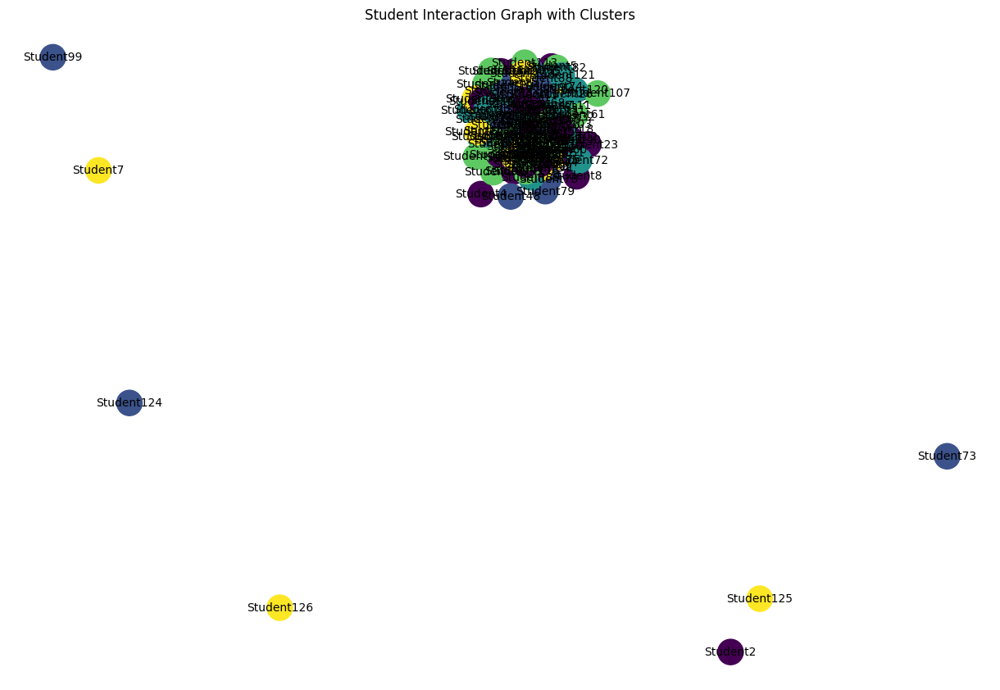

In [ ]:
import matplotlib.pyplot as plt

# Get cluster assignments for visualization
node_colors = [student_graph_before_covid.nodes[node]['cluster'] for node in student_graph_before_covid.nodes()]

# Draw the graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(student_graph_before_covid)
nx.draw(student_graph_before_covid, pos=pos, with_labels=True, node_color=node_colors, cmap=plt.cm.viridis, node_size=500, font_size=10)
plt.title("Student Interaction Graph with Clusters")
plt.show()

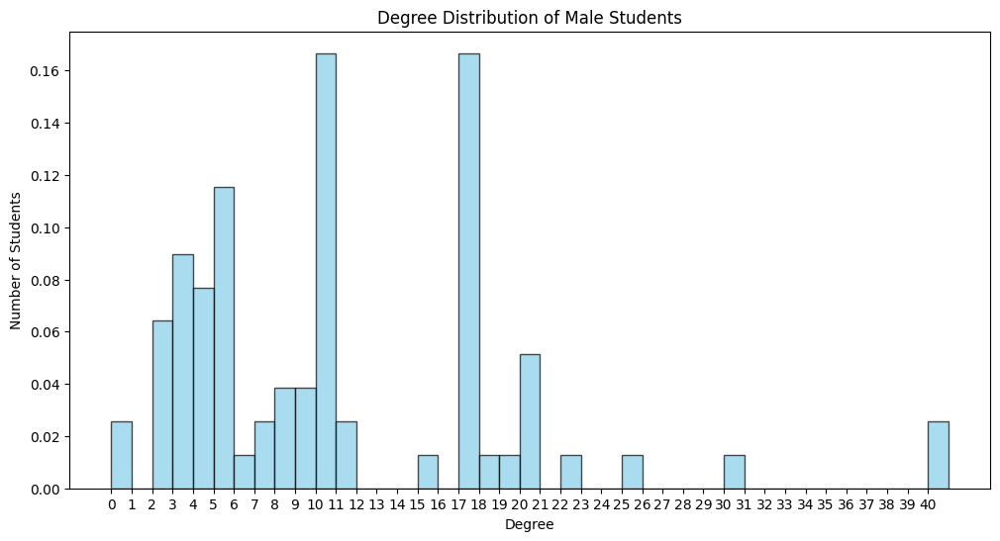

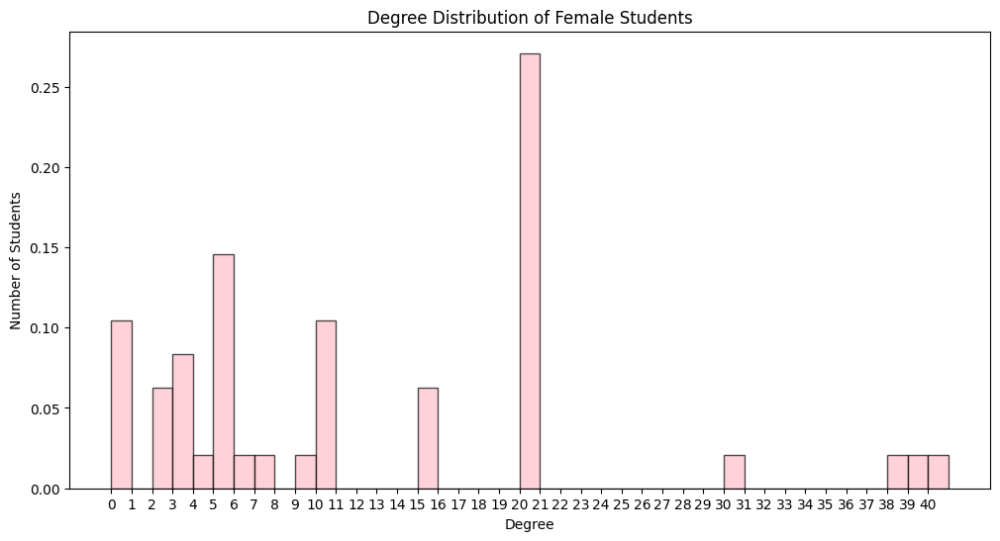

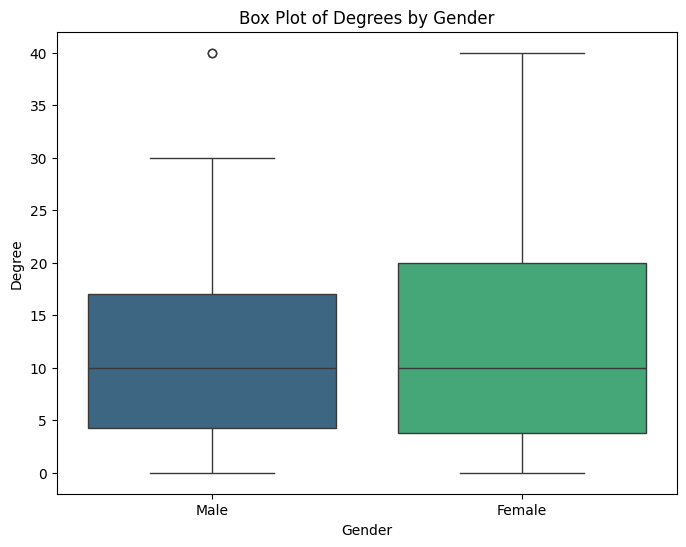

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns


# Step 2: Calculate degrees and separate by gender
degrees = {n: student_graph_before_covid.degree(n) for n in student_graph_before_covid.nodes()}
gender_degrees = {'Male': [], 'Female': []}

for node, attrs in student_graph_before_covid.nodes(data=True):
    gender = attrs['Gender']
    gender_degrees[gender].append(degrees[node])

# Step 3: Visualize the degree distribution using histograms

# Histogram for male students
plt.figure(figsize=(12, 6))
plt.hist(gender_degrees['Male'], bins=range(max(degrees.values()) + 2), density=True, alpha=0.7, color='skyblue', edgecolor='black')
plt.title('Degree Distribution of Male Students')
plt.xlabel('Degree')
plt.ylabel('Number of Students')
plt.xticks(range(max(degrees.values()) + 1))
plt.show()
print()

# Histogram for female students
plt.figure(figsize=(12, 6))
plt.hist(gender_degrees['Female'], bins=range(max(degrees.values()) + 2), density=True, alpha=0.7, color='pink', edgecolor='black')
plt.title('Degree Distribution of Female Students')
plt.xlabel('Degree')
plt.ylabel('Number of Students')
plt.xticks(range(max(degrees.values()) + 1))
plt.show()
print()


# Step 4: Create a box plot to compare degrees
degree_data = pd.DataFrame({
    'Degree': [degree for gender in gender_degrees for degree in gender_degrees[gender]],
    'Gender': [gender for gender in gender_degrees for _ in gender_degrees[gender]]
})

plt.figure(figsize=(8, 6))
sns.boxplot(x='Gender', y='Degree', data=degree_data, hue='Gender', palette='viridis')
plt.title('Box Plot of Degrees by Gender')
plt.ylabel('Degree')
plt.xlabel('Gender')
plt.show()

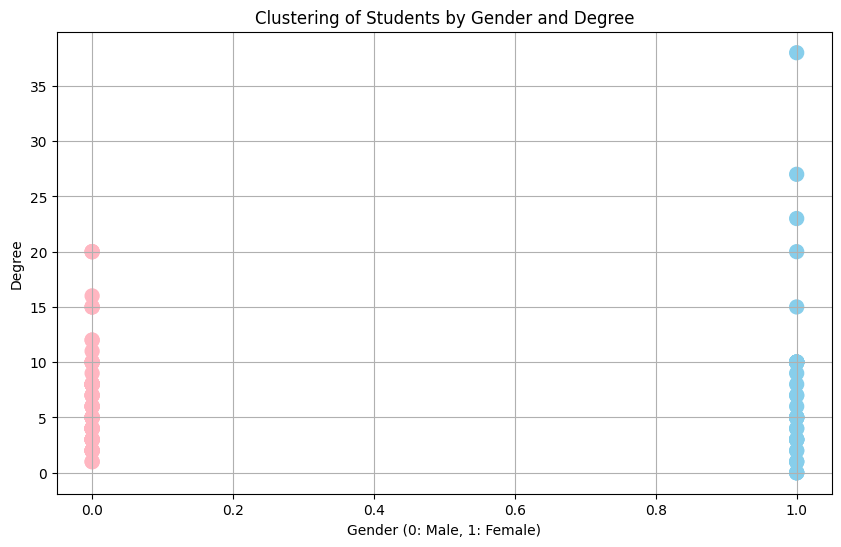

        student  gender  degree  gender_encoded  cluster
0      Student1    Male      10               0        1
1      Student2    Male      20               0        1
2      Student3    Male      20               0        1
3      Student4    Male       2               0        1
4      Student5    Male       2               0        1
..          ...     ...     ...             ...      ...
121  Student122  Female       1               1        0
122  Student123  Female       0               1        0
123  Student124  Female       0               1        0
124  Student125  Female       0               1        0
125  Student126  Female       0               1        0

[126 rows x 5 columns]


In [ ]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Assuming you already have a graph G created with nodes having 'gender' attribute
# Example: G = nx.Graph() and you have added nodes and edges

# Step 1: Create a DataFrame from the graph
data = {
    'student': list(student_graph_during_covid.nodes()),
    'gender': [student_graph_during_covid.nodes[n]['Gender'] for n in student_graph_during_covid.nodes()],
    'degree': [student_graph_during_covid.degree(n) for n in student_graph_during_covid.nodes()]
}

df = pd.DataFrame(data)

# Step 2: Encode gender as numerical values
df['gender_encoded'] = df['gender'].map({'Male': 0, 'Female': 1})

# Step 3: Create a feature matrix
X = df[['degree', 'gender_encoded']]

# Step 4: Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 5: Perform K-Means clustering
kmeans = KMeans(n_clusters=2, random_state=42)  # Change n_clusters as needed
clusters = kmeans.fit_predict(X_scaled)

# Step 6: Visualize the clusters
plt.figure(figsize=(10, 6))
colors = ['skyblue', 'lightpink'] # Define colors for each cluster
plt.scatter( df['gender_encoded'], df['degree'], c=[colors[i] for i in clusters], s=100)

plt.title('Clustering of Students by Gender and Degree')
plt.ylabel('Degree')
plt.xlabel('Gender (0: Male, 1: Female)')
#plt.xticks([0, 1, 2])
plt.grid()
plt.show()

# Step 7: Print the DataFrame with clusters
df['cluster'] = clusters
print(df)

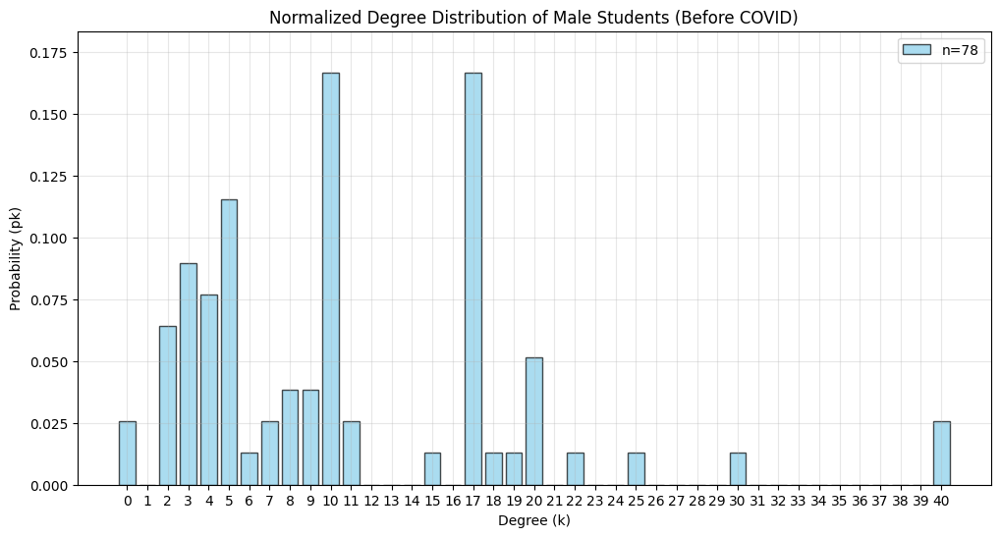

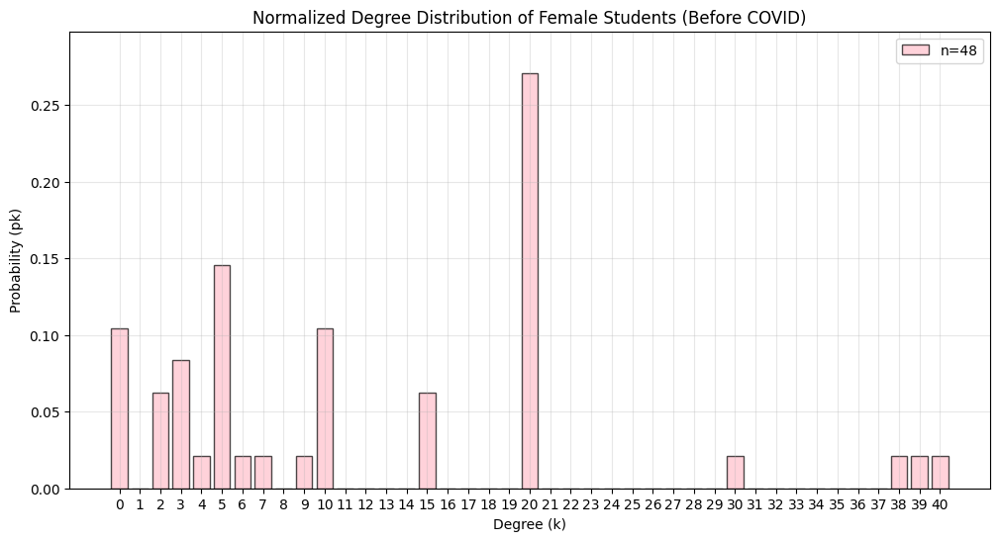

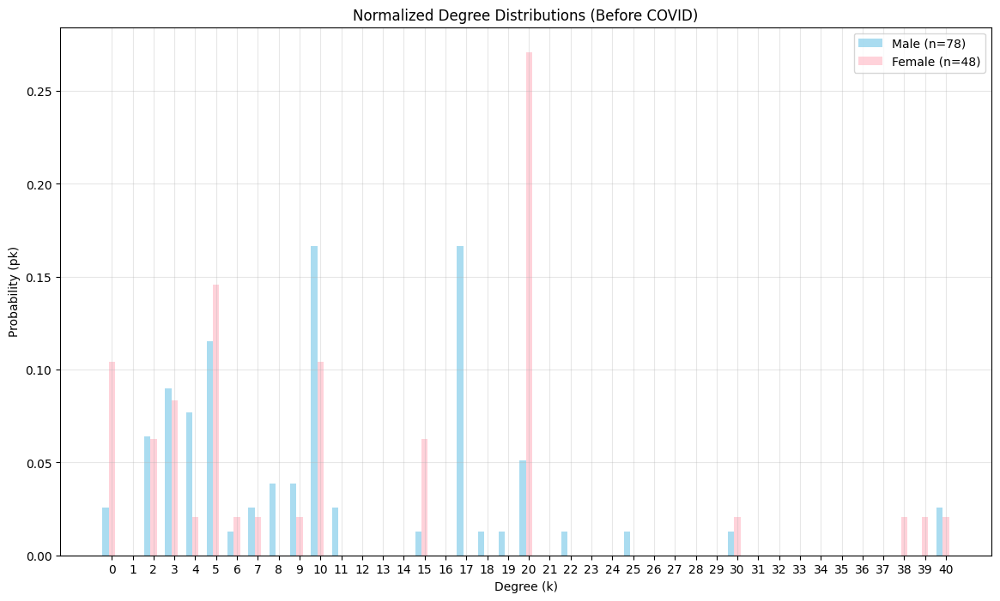

In [ ]:
#NORMALISED DEGREE DISTRIBUTION - BASED ON GENDER (BEFORE COVID)
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# Step 1: Calculate degrees and separate by gender
degrees_before_covid = {n: student_graph_before_covid.degree(n) for n in student_graph_before_covid.nodes()}
gender_degrees_before_covid = {'Male': [], 'Female': []}

for node, attrs in student_graph_before_covid.nodes(data=True):
    gender = attrs['Gender']
    gender_degrees_before_covid[gender].append(degrees_before_covid[node])

# Step 2: Calculate degree distributions by gender
max_degree_before_covid = max(degrees_before_covid.values())
degree_range_before_covid = range(max_degree_before_covid + 1)

# Function to calculate degree distribution (probability)
def calculate_pk(degree_list):
    n_total = len(degree_list)
    if n_total == 0:
        return [0] * (max_degree_before_covid + 1)

    # Count nodes with each degree
    degree_counts = {}
    for d in degree_range_before_covid:
        degree_counts[d] = degree_list.count(d)

    # Calculate probability pk = Nk/N
    pk_values = [degree_counts.get(d, 0) / n_total for d in degree_range_before_covid]
    return pk_values

# Calculate pk for each gender
pk_male_before_covid = calculate_pk(gender_degrees_before_covid['Male'])
pk_female_before_covid = calculate_pk(gender_degrees_before_covid['Female'])

# Step 3: Plotting normalized degree distributions
# For male students
plt.figure(figsize=(12, 6))
plt.bar(degree_range_before_covid, pk_male_before_covid, alpha=0.7, color='skyblue', edgecolor='black', width=0.8,
       label=f"n={len(gender_degrees_before_covid['Male'])}")
plt.title('Normalized Degree Distribution of Male Students (Before COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_before_covid)
plt.ylim(0, max(pk_male_before_covid) * 1.1)  # Add some padding
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# For female students
plt.figure(figsize=(12, 6))
plt.bar(degree_range_before_covid, pk_female_before_covid, alpha=0.7, color='pink', edgecolor='black', width=0.8,
       label=f"n={len(gender_degrees_before_covid['Female'])}")
plt.title('Normalized Degree Distribution of Female Students (Before COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_before_covid)
plt.ylim(0, max(pk_female_before_covid) * 1.1)  # Add some padding
plt.legend()
plt.grid(alpha=0.3)
plt.show()


# Optional: Plot all distributions together for comparison
plt.figure(figsize=(14, 8))
plt.bar([x-0.3 for x in degree_range_before_covid], pk_male_before_covid, alpha=0.7, color='skyblue',
       width=0.3, label=f"Male (n={len(gender_degrees_before_covid['Male'])})")
plt.bar([x for x in degree_range_before_covid], pk_female_before_covid, alpha=0.7, color='pink',
       width=0.3, label=f"Female (n={len(gender_degrees_before_covid['Female'])})")
plt.title('Normalized Degree Distributions (Before COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_before_covid)
plt.legend()
plt.grid(alpha=0.3)
plt.show()

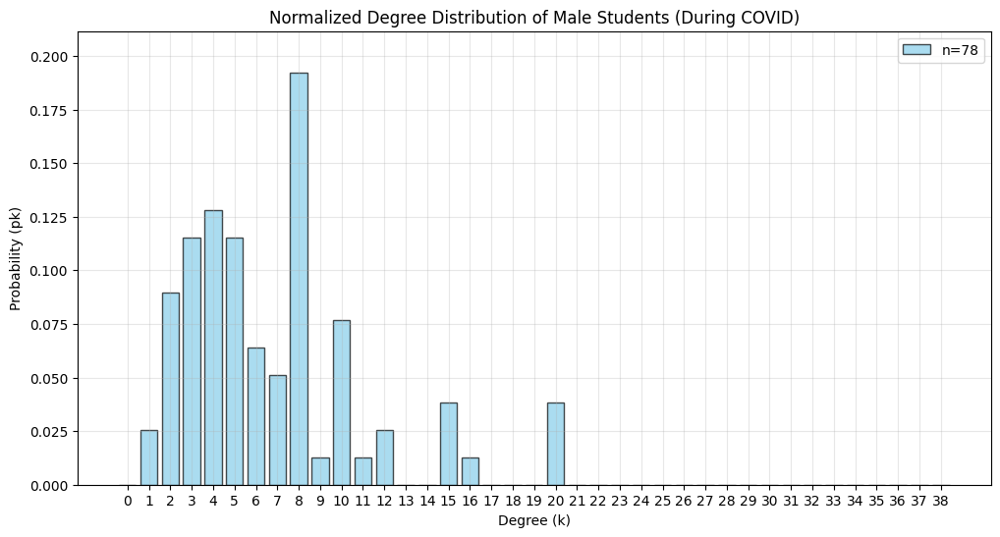

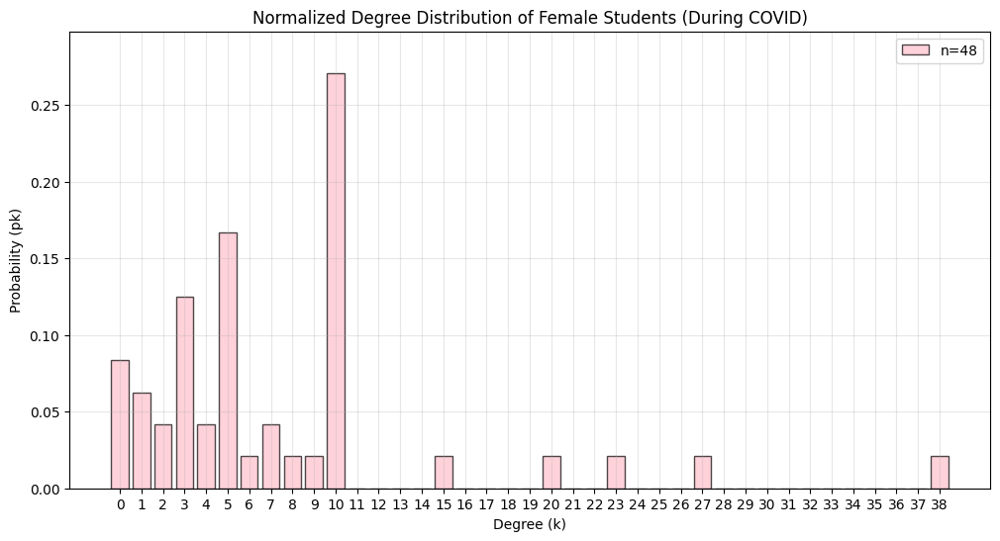

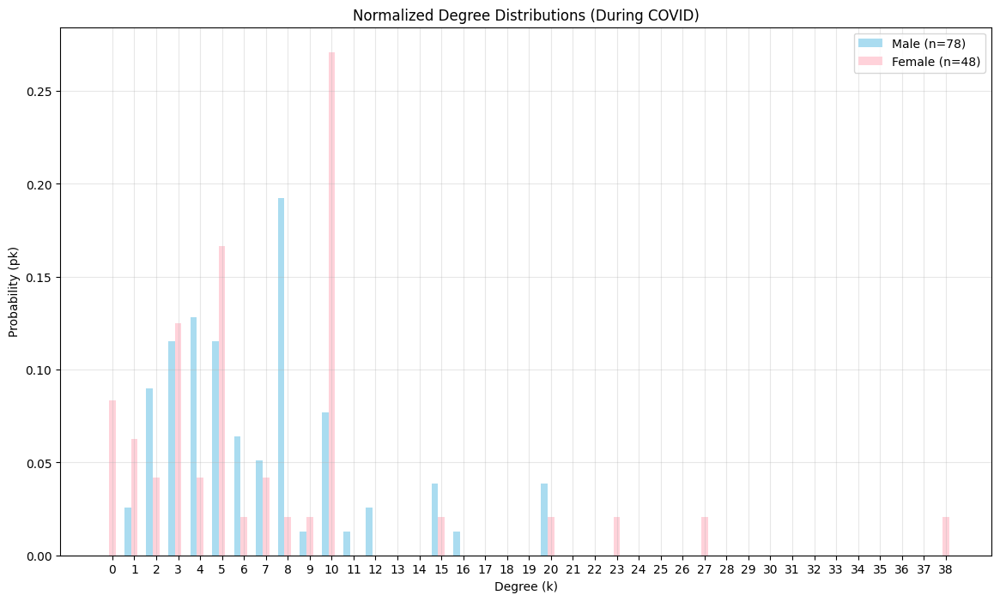

In [ ]:
#NORMALISED DEGREE DISTRIBUTION - BASED ON GENDER (DURING COVID)
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# Step 1: Calculate degrees and separate by gender
degrees_during_covid = {n: student_graph_during_covid.degree(n) for n in student_graph_during_covid.nodes()}
gender_degrees_during_covid = {'Male': [], 'Female': []}

for node, attrs in student_graph_during_covid.nodes(data=True):
    gender = attrs['Gender']
    gender_degrees_during_covid[gender].append(degrees_during_covid[node])

# Step 2: Calculate degree distributions by gender
max_degree_during_covid = max(degrees_during_covid.values())
degree_range_during_covid = range(max_degree_during_covid + 1)

# Function to calculate degree distribution (probability)
def calculate_pk(degree_list):
    n_total = len(degree_list)
    if n_total == 0:
        return [0] * (max_degree_during_covid + 1)

    # Count nodes with each degree
    degree_counts = {}
    for d in degree_range_during_covid:
        degree_counts[d] = degree_list.count(d)

    # Calculate probability pk = Nk/N
    pk_values = [degree_counts.get(d, 0) / n_total for d in degree_range_during_covid]
    return pk_values

# Calculate pk for each gender
pk_male_during_covid = calculate_pk(gender_degrees_during_covid['Male'])
pk_female_during_covid = calculate_pk(gender_degrees_during_covid['Female'])

# Step 3: Plotting normalized degree distributions
# For male students
plt.figure(figsize=(12, 6))
plt.bar(degree_range_during_covid, pk_male_during_covid, alpha=0.7, color='skyblue', edgecolor='black', width=0.8,
       label=f"n={len(gender_degrees_during_covid['Male'])}")
plt.title('Normalized Degree Distribution of Male Students (During COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_during_covid)
plt.ylim(0, max(pk_male_during_covid) * 1.1)  # Add some padding
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# For female students
plt.figure(figsize=(12, 6))
plt.bar(degree_range_during_covid, pk_female_during_covid, alpha=0.7, color='pink', edgecolor='black', width=0.8,
       label=f"n={len(gender_degrees_during_covid['Female'])}")
plt.title('Normalized Degree Distribution of Female Students (During COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_during_covid)
plt.ylim(0, max(pk_female_during_covid) * 1.1)  # Add some padding
plt.legend()
plt.grid(alpha=0.3)
plt.show()


# Optional: Plot all distributions together for comparison
plt.figure(figsize=(14, 8))
plt.bar([x-0.3 for x in degree_range_during_covid], pk_male_during_covid, alpha=0.7, color='skyblue',
       width=0.3, label=f"Male (n={len(gender_degrees_during_covid['Male'])})")
plt.bar([x for x in degree_range_during_covid], pk_female_during_covid, alpha=0.7, color='pink',
       width=0.3, label=f"Female (n={len(gender_degrees_during_covid['Female'])})")

plt.title('Normalized Degree Distributions (During COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_during_covid)
plt.legend()
plt.grid(alpha=0.3)
plt.show()


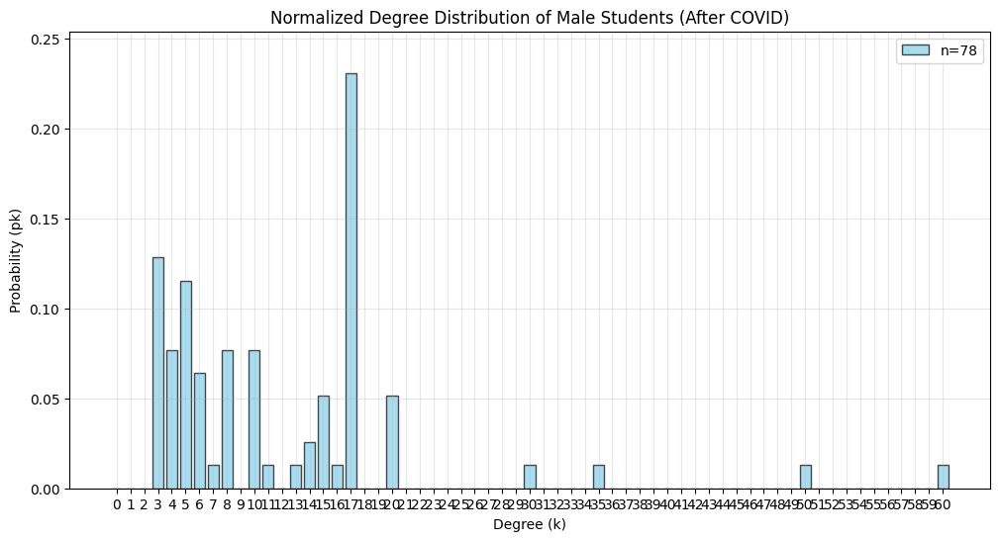

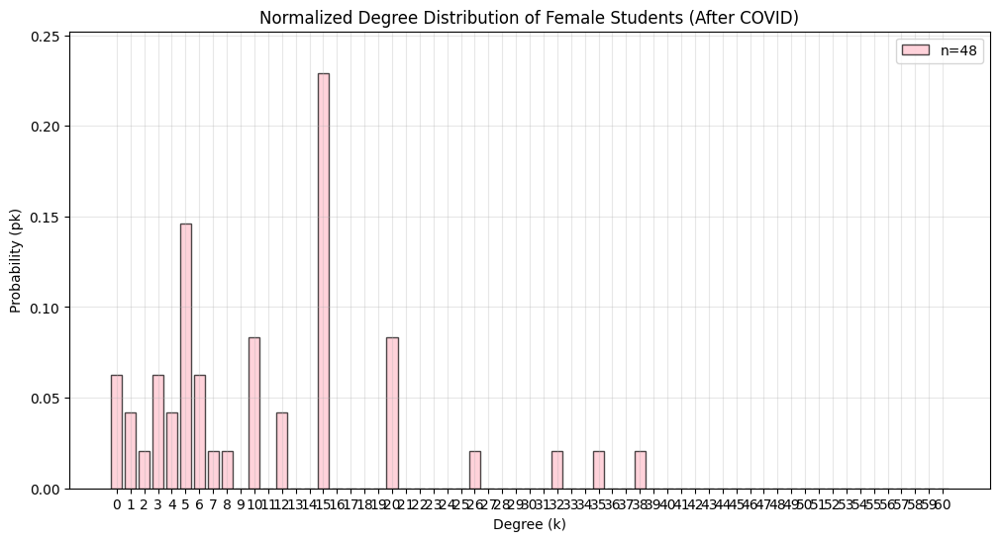

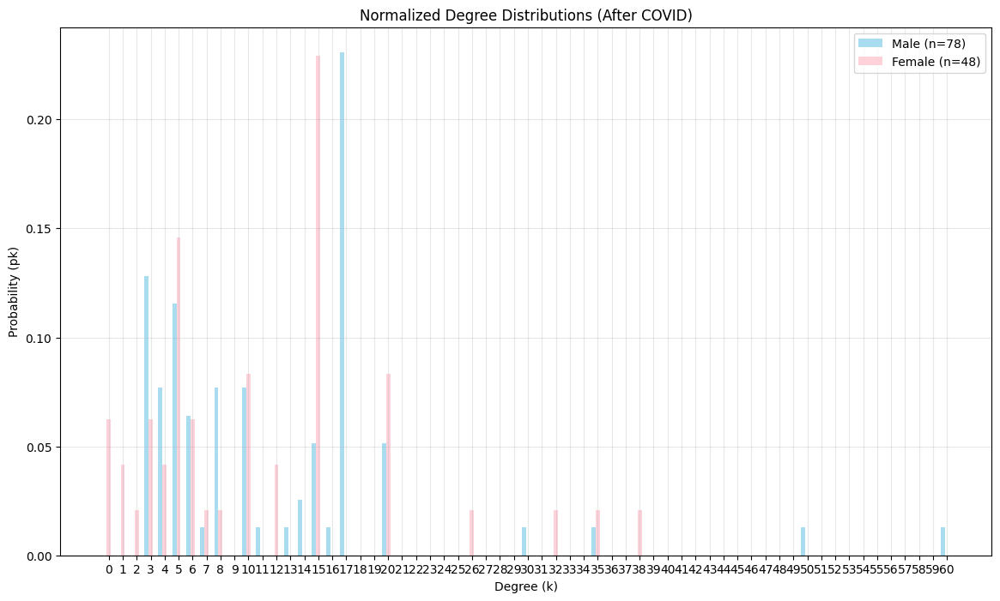

In [ ]:
#NORMALISED DEGREE DISTRIBUTION - BASED ON GENDER (AFTER COVID)
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# Step 1: Calculate degrees and separate by gender
degrees_after_covid = {n: student_graph_after_covid.degree(n) for n in student_graph_after_covid.nodes()}
gender_degrees_after_covid = {'Male': [], 'Female': []}

for node, attrs in student_graph_after_covid.nodes(data=True):
    gender = attrs['Gender']
    gender_degrees_after_covid[gender].append(degrees_after_covid[node])

# Step 2: Calculate degree distributions by gender
max_degree_after_covid = max(degrees_after_covid.values())
degree_range_after_covid = range(max_degree_after_covid + 1)

# Function to calculate degree distribution (probability)
def calculate_pk(degree_list):
    n_total = len(degree_list)
    if n_total == 0:
        return [0] * (max_degree_after_covid + 1)

    # Count nodes with each degree
    degree_counts = {}
    for d in degree_range_after_covid:
        degree_counts[d] = degree_list.count(d)

    # Calculate probability pk = Nk/N
    pk_values = [degree_counts.get(d, 0) / n_total for d in degree_range_after_covid]
    return pk_values

# Calculate pk for each gender
pk_male_after_covid = calculate_pk(gender_degrees_after_covid['Male'])
pk_female_after_covid = calculate_pk(gender_degrees_after_covid['Female'])

# Step 3: Plotting normalized degree distributions
# For male students
plt.figure(figsize=(12, 6))
plt.bar(degree_range_after_covid, pk_male_after_covid, alpha=0.7, color='skyblue', edgecolor='black', width=0.8,
       label=f"n={len(gender_degrees_after_covid['Male'])}")
plt.title('Normalized Degree Distribution of Male Students (After COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_after_covid)
plt.ylim(0, max(pk_male_after_covid) * 1.1)  # Add some padding
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# For female students
plt.figure(figsize=(12, 6))
plt.bar(degree_range_after_covid, pk_female_after_covid, alpha=0.7, color='pink', edgecolor='black', width=0.8,
       label=f"n={len(gender_degrees_after_covid['Female'])}")
plt.title('Normalized Degree Distribution of Female Students (After COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_after_covid)
plt.ylim(0, max(pk_female_after_covid) * 1.1)  # Add some padding
plt.legend()
plt.grid(alpha=0.3)
plt.show()


# Optional: Plot all distributions together for comparison
plt.figure(figsize=(14, 8))
plt.bar([x-0.3 for x in degree_range_after_covid], pk_male_after_covid, alpha=0.7, color='skyblue',
       width=0.3, label=f"Male (n={len(gender_degrees_after_covid['Male'])})")
plt.bar([x for x in degree_range_after_covid], pk_female_after_covid, alpha=0.7, color='pink',
       width= 0.3, label=f"Female (n={len(gender_degrees_after_covid['Female'])})")

plt.title('Normalized Degree Distributions (After COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_after_covid)
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [ ]:
#CORRELATION COEFFICIENT - ALL STUDENTS

import numpy as np
from scipy.stats import pearsonr

# Create a common degree range that includes all possible degrees
max_degree = max(max(degree_range_before_covid), max(degree_range_during_covid), max(degree_range_after_covid))
common_degree_range = range(max_degree + 1)

# Function to align pk values to a common degree range
def align_pk_to_common_range(pk_values, common_range):
    aligned_pk = [0] * (len(common_range))  # Initialize with zeros
    for degree in range(len(pk_values)):
        if degree < len(aligned_pk):  # Ensure we don't go out of bounds
            aligned_pk[degree] = pk_values[degree]  # Fill in the pk values at the corresponding degree
    return aligned_pk

# Assuming you have already calculated pk values for all students
# Combine pk values for all students (not separating by gender)
pk_all_students_before = pk_male_before_covid + pk_female_before_covid  # Combine if you have separate pk values
pk_all_students_during = pk_male_during_covid + pk_female_during_covid  # Combine if you have separate pk values
pk_all_students_after = pk_male_after_covid + pk_female_after_covid  # Combine if you have separate pk values

# Align pk values for all students
pk_all_students_before_aligned = align_pk_to_common_range(pk_all_students_before, common_degree_range)
pk_all_students_during_aligned = align_pk_to_common_range(pk_all_students_during, common_degree_range)
pk_all_students_after_aligned = align_pk_to_common_range(pk_all_students_after, common_degree_range)

# Calculate correlation coefficients using aligned pk values for all students
correlation_all_students_before_during = pearsonr(pk_all_students_before_aligned, pk_all_students_during_aligned)[0]
correlation_all_students_during_after = pearsonr(pk_all_students_during_aligned, pk_all_students_after_aligned)[0]
correlation_all_students_before_after = pearsonr(pk_all_students_before_aligned, pk_all_students_after_aligned)[0]

# Print the correlation coefficients for all students
print("ALL STUDENTS ANALYSIS: ")
print(f"Correlation coefficient for All students (Before vs During): {correlation_all_students_before_during:.4f}")
print(f"Correlation coefficient for All students (During vs After): {correlation_all_students_during_after:.4f}")
print(f"Correlation coefficient for All students (Before vs After): {correlation_all_students_before_after:.4f}")

ALL STUDENTS ANALYSIS: 
Correlation coefficient for All students (Before vs During): 0.3008
Correlation coefficient for All students (During vs After): 0.2747
Correlation coefficient for All students (Before vs After): 0.6121


In [ ]:
#CORRELATION COEFFICIENT (GENDER WISE)

import numpy as np
from scipy.stats import pearsonr

# Create a common degree range that includes all possible degrees
max_degree = max(max(degree_range_before_covid), max(degree_range_during_covid), max(degree_range_after_covid))
common_degree_range = range(max_degree + 1)

# Function to align pk values to a common degree range
def align_pk_to_common_range(pk_values, common_range):
    aligned_pk = [0] * (max(common_range) + 1)  # Initialize with zeros
    for degree, pk in zip(range(len(pk_values)), pk_values):
        aligned_pk[degree] = pk  # Fill in the pk values at the corresponding degree
    return aligned_pk

# Align pk values for each gender and time period
pk_male_before_aligned = align_pk_to_common_range(pk_male_before_covid, common_degree_range)
pk_male_during_aligned = align_pk_to_common_range(pk_male_during_covid, common_degree_range)
pk_male_after_aligned = align_pk_to_common_range(pk_male_after_covid, common_degree_range)

pk_female_before_aligned = align_pk_to_common_range(pk_female_before_covid, common_degree_range)
pk_female_during_aligned = align_pk_to_common_range(pk_female_during_covid, common_degree_range)
pk_female_after_aligned = align_pk_to_common_range(pk_female_after_covid, common_degree_range)


# Calculate correlation coefficients using aligned pk values
correlation_male_before_during = pearsonr(pk_male_before_aligned, pk_male_during_aligned)[0]
correlation_male_during_after = pearsonr(pk_male_during_aligned, pk_male_after_aligned)[0]
correlation_male_before_after = pearsonr(pk_male_before_aligned, pk_male_after_aligned)[0]

correlation_female_before_during = pearsonr(pk_female_before_aligned, pk_female_during_aligned)[0]
correlation_female_during_after = pearsonr(pk_female_during_aligned, pk_female_after_aligned)[0]
correlation_female_before_after = pearsonr(pk_female_before_aligned, pk_female_after_aligned)[0]


# Print the correlation coefficients
print("MALE STUDENTS ANALYSIS: ")
print(f"Correlation coefficient for Male students (Before vs During): {correlation_male_before_during:.4f}")
print(f"Correlation coefficient for Male students (During vs After): {correlation_male_during_after:.4f}")
print(f"Correlation coefficient for Male students (Before vs After): {correlation_male_before_after:.4f}")

print("\n\nFEMALE STUDENTS ANALYSIS")
print(f"Correlation coefficient for Female students (Before vs During): {correlation_female_before_during:.4f}")
print(f"Correlation coefficient for Female students (During vs After): {correlation_female_during_after:.4f}")
print(f"Correlation coefficient for Female students (Before vs After): {correlation_female_before_after:.4f}")


MALE STUDENTS ANALYSIS: 
Correlation coefficient for Male students (Before vs During): 0.5750
Correlation coefficient for Male students (During vs After): 0.5557
Correlation coefficient for Male students (Before vs After): 0.8406


FEMALE STUDENTS ANALYSIS
Correlation coefficient for Female students (Before vs During): 0.5697
Correlation coefficient for Female students (During vs After): 0.5570
Correlation coefficient for Female students (Before vs After): 0.6405


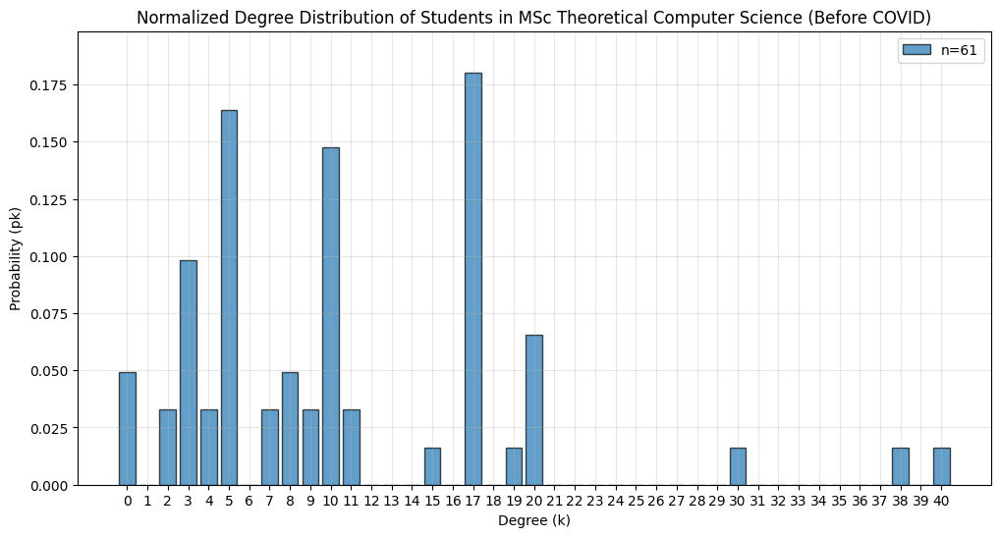

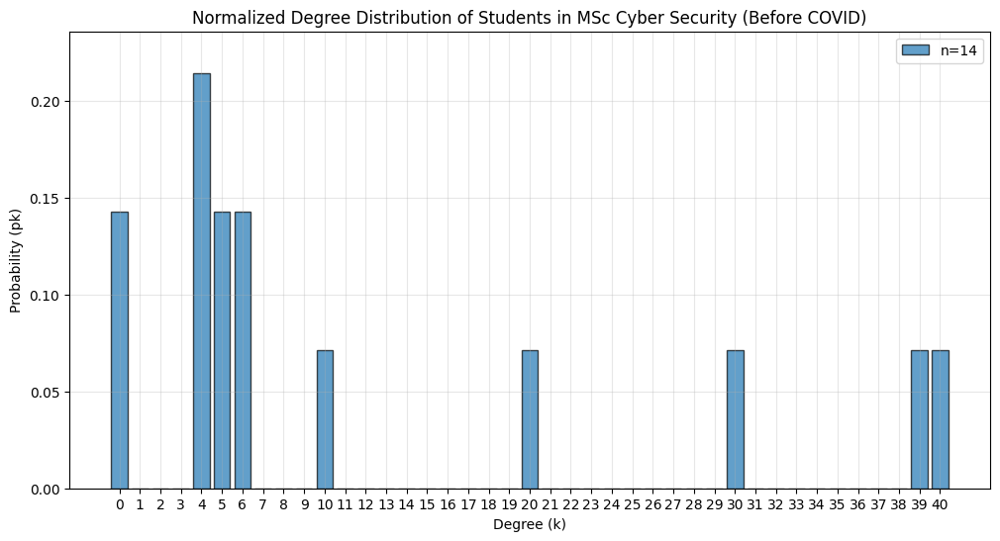

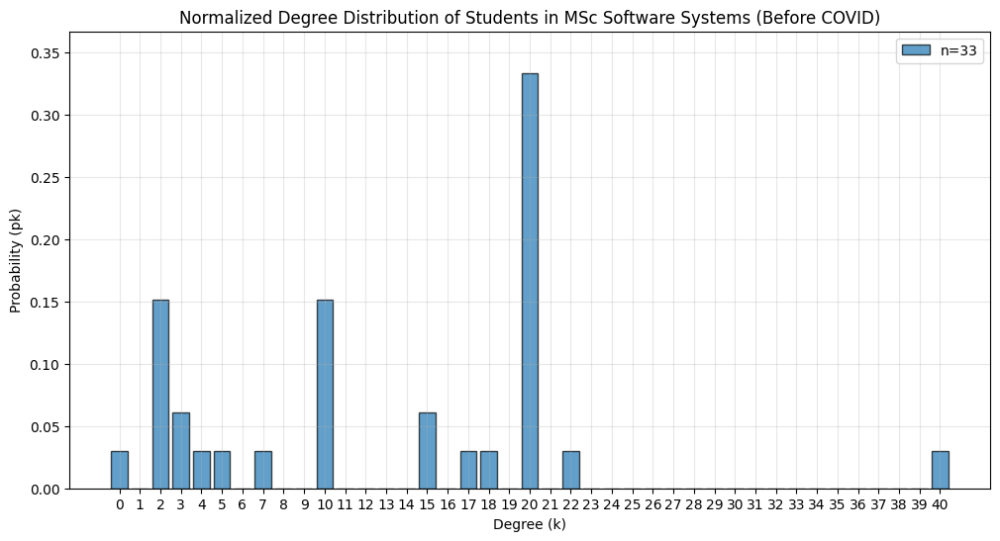

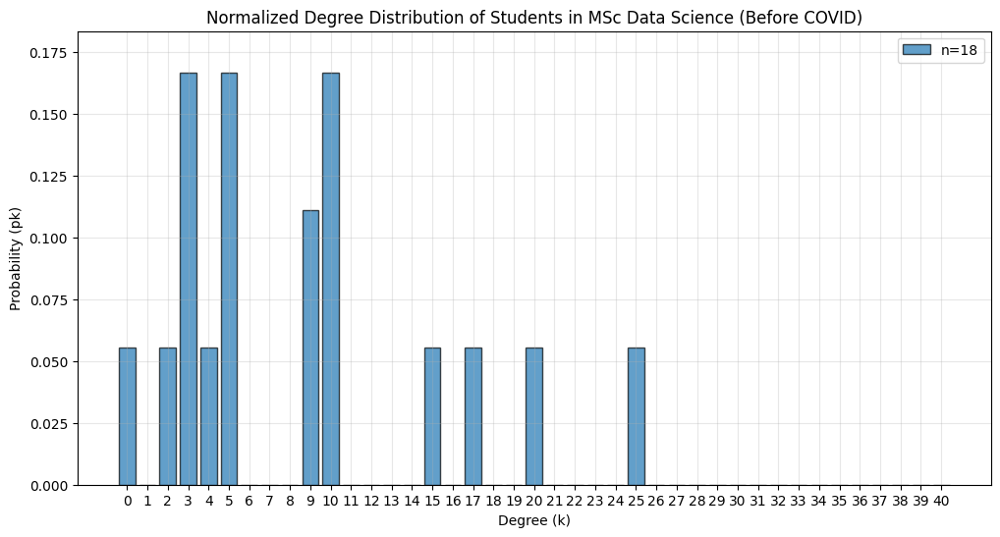

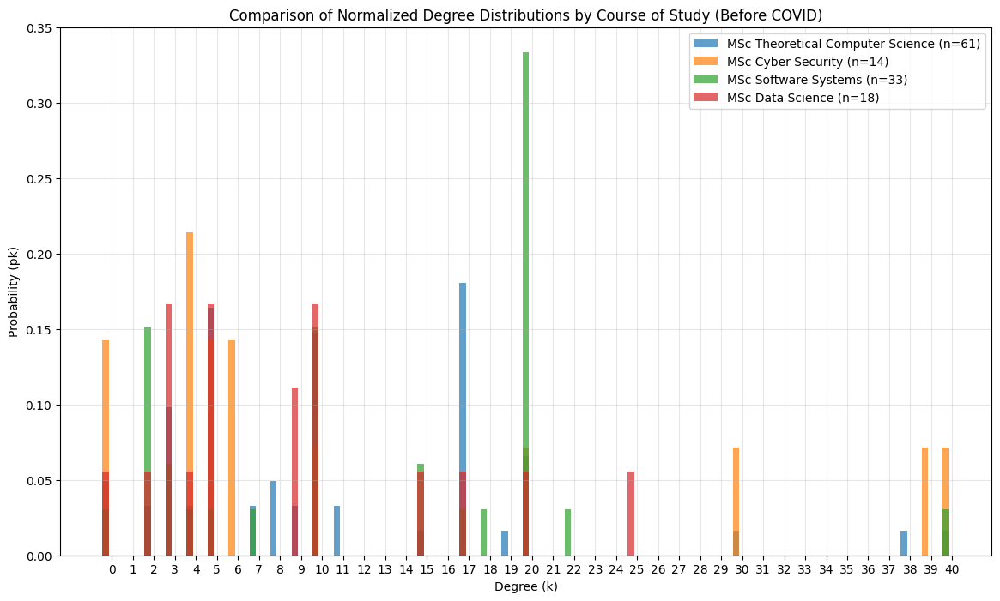

In [ ]:
#NORMALISED DEGREE DISTRIBUTION - BASED ON COURSE(BEFORE COVID)
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# Step 1: Calculate degrees and separate by course of study
degrees_before_covid = {n: student_graph_before_covid.degree(n) for n in student_graph_before_covid.nodes()}
course_degrees_before_covid = {}

for node, attrs in student_graph_before_covid.nodes(data=True):
    course = attrs['Course of Study']  # Assuming 'Course of Study' is the attribute name
    if course not in course_degrees_before_covid:
        course_degrees_before_covid[course] = []
    course_degrees_before_covid[course].append(degrees_before_covid[node])

# Step 2: Calculate degree distributions by course of study
max_degree_before_covid = max(degrees_before_covid.values())
degree_range_before_covid = range(max_degree_before_covid + 1)

# Function to calculate degree distribution (probability)
def calculate_pk(degree_list):
    n_total = len(degree_list)
    if n_total == 0:
        return [0] * (max_degree_before_covid + 1)

    # Count nodes with each degree
    degree_counts = {}
    for d in degree_range_before_covid:
        degree_counts[d] = degree_list.count(d)

    # Calculate probability pk = Nk/N
    pk_values = [degree_counts.get(d, 0) / n_total for d in degree_range_before_covid]
    return pk_values

# Calculate pk for each course of study
pk_courses_before_covid = {}
for course, degrees in course_degrees_before_covid.items():
    pk_courses_before_covid[course] = calculate_pk(degrees)

# Step 3: Plotting normalized degree distributions for each course of study
for course, pk_values in pk_courses_before_covid.items():
    plt.figure(figsize=(12, 6))
    plt.bar(degree_range_before_covid, pk_values, alpha=0.7, edgecolor='black', width=0.8,
            label=f"n={len(course_degrees_before_covid[course])}")
    plt.title(f'Normalized Degree Distribution of Students in {course} (Before COVID)')
    plt.xlabel('Degree (k)')
    plt.ylabel('Probability (pk)')
    plt.xticks(degree_range_before_covid)
    plt.ylim(0, max(pk_values) * 1.1)  # Add some padding
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

# Optional: Plot all distributions together for comparison
plt.figure(figsize=(14, 8))
for course, pk_values in pk_courses_before_covid.items():
    plt.bar([x - 0.3 for x in degree_range_before_covid], pk_values, alpha=0.7, width=0.3,
            label=f"{course} (n={len(course_degrees_before_covid[course])})")
plt.title('Comparison of Normalized Degree Distributions by Course of Study (Before COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_before_covid)
plt.legend()
plt.grid(alpha=0.3)
plt.show()

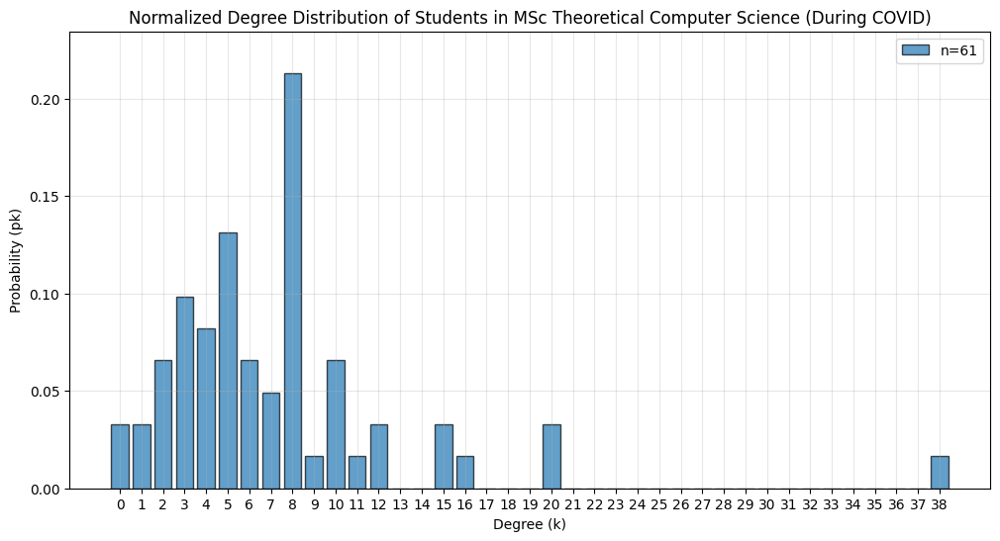

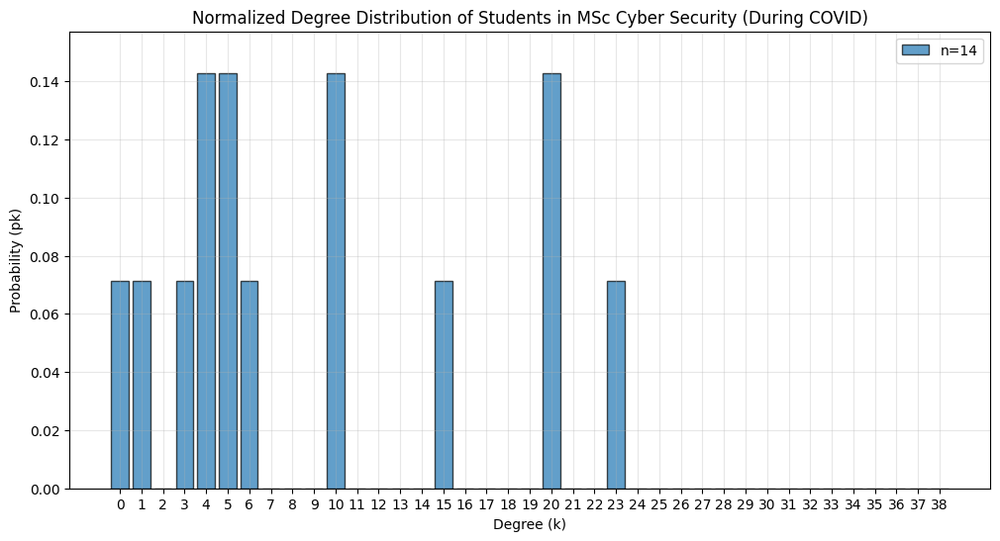

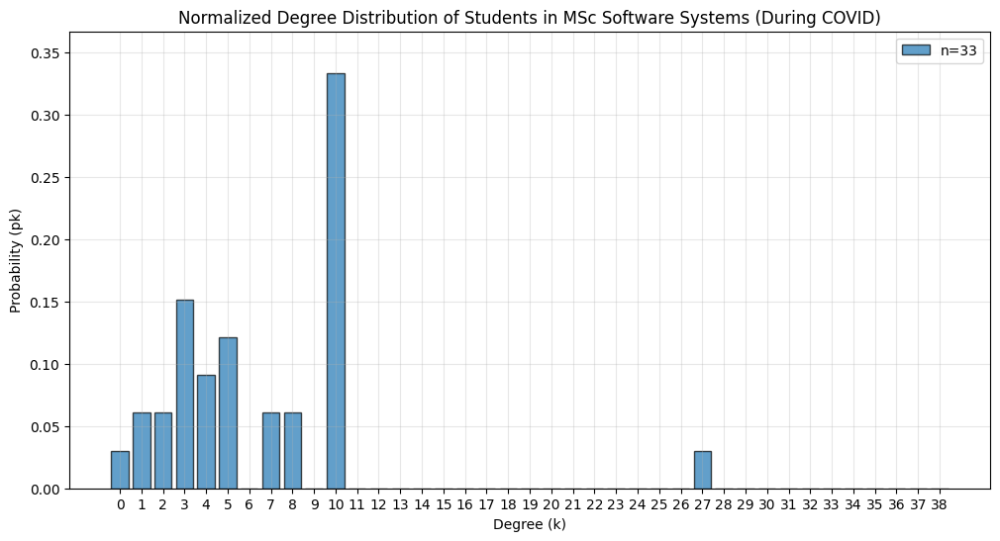

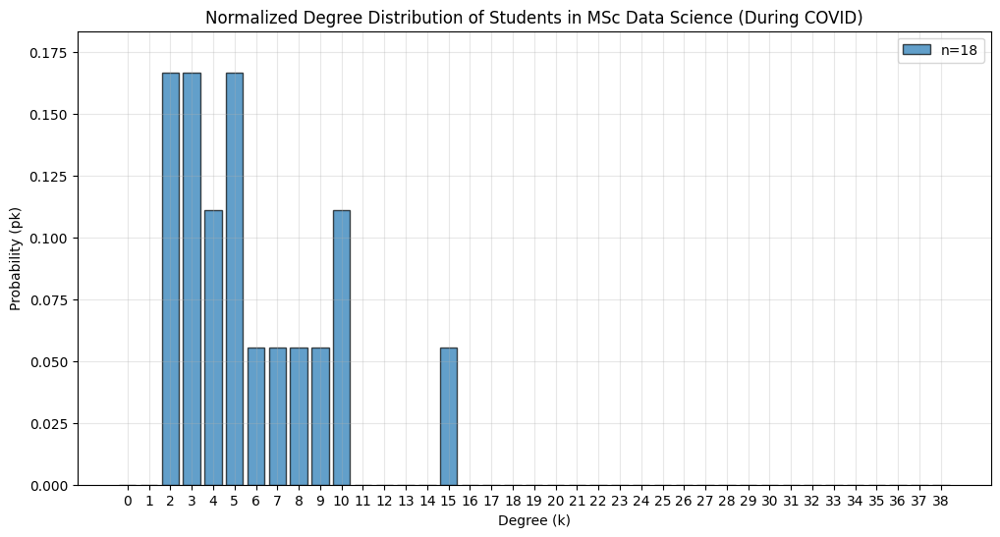

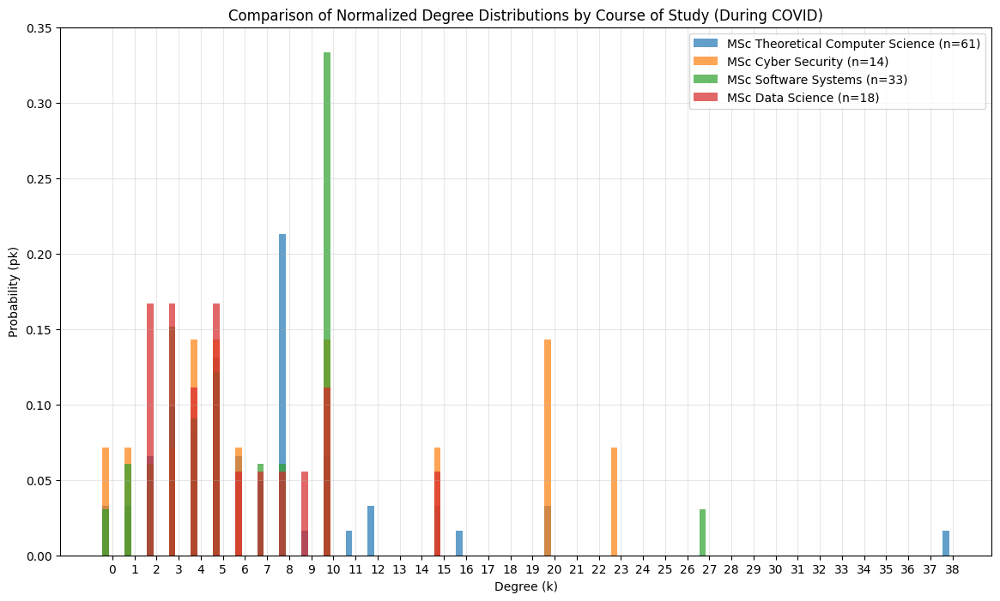

In [ ]:
#NORMALISED DEGREE DISTRIBUTION - BASED ON COURSE(DURING COVID)

# Step 1: Calculate degrees and separate by course of study during COVID
degrees_during_covid = {n: student_graph_during_covid.degree(n) for n in student_graph_during_covid.nodes()}
course_degrees_during_covid = {}

for node, attrs in student_graph_during_covid.nodes(data=True):
    course = attrs['Course of Study']  # Assuming 'Course of Study' is the attribute name
    if course not in course_degrees_during_covid:
        course_degrees_during_covid[course] = []
    course_degrees_during_covid[course].append(degrees_during_covid[node])

# Step 2: Calculate degree distributions by course of study
max_degree_during_covid = max(degrees_during_covid.values())
degree_range_during_covid = range(max_degree_during_covid + 1)

# Function to calculate degree distribution (probability)
def calculate_pk(degree_list):
    n_total = len(degree_list)
    if n_total == 0:
        return [0] * (max_degree_during_covid + 1)

    # Count nodes with each degree
    degree_counts = {}
    for d in degree_range_during_covid:
        degree_counts[d] = degree_list.count(d)

    # Calculate probability pk = Nk/N
    pk_values = [degree_counts.get(d, 0) / n_total for d in degree_range_during_covid]
    return pk_values

# Calculate pk for each course of study
pk_courses_during_covid = {}
for course, degrees in course_degrees_during_covid.items():
    pk_courses_during_covid[course] = calculate_pk(degrees)

# Step 3: Plotting normalized degree distributions for each course of study during COVID
for course, pk_values in pk_courses_during_covid.items():
    plt.figure(figsize=(12, 6))
    plt.bar(degree_range_during_covid, pk_values, alpha=0.7, edgecolor='black', width=0.8,
            label=f"n={len(course_degrees_during_covid[course])}")
    plt.title(f'Normalized Degree Distribution of Students in {course} (During COVID)')
    plt.xlabel('Degree (k)')
    plt.ylabel('Probability (pk)')
    plt.xticks(degree_range_during_covid)
    plt.ylim(0, max(pk_values) * 1.1)  # Add some padding
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

# Optional: Plot all distributions together for comparison
plt.figure(figsize=(14, 8))
for course, pk_values in pk_courses_during_covid.items():
    plt.bar([x - 0.3 for x in degree_range_during_covid], pk_values, alpha=0.7, width=0.3,
            label=f"{course} (n={len(course_degrees_during_covid[course])})")
plt.title('Comparison of Normalized Degree Distributions by Course of Study (During COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_during_covid)
plt.legend()
plt.grid(alpha=0.3)
plt.show()

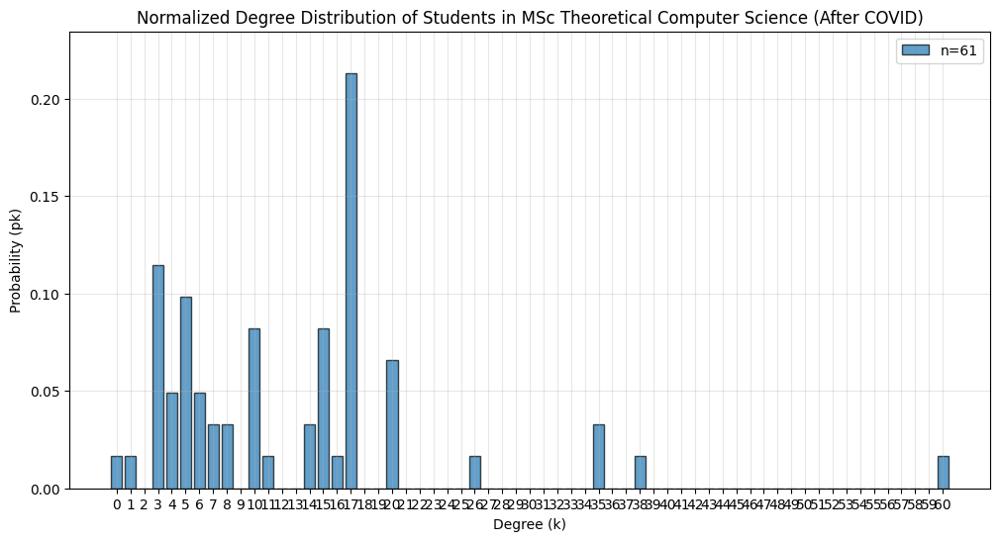

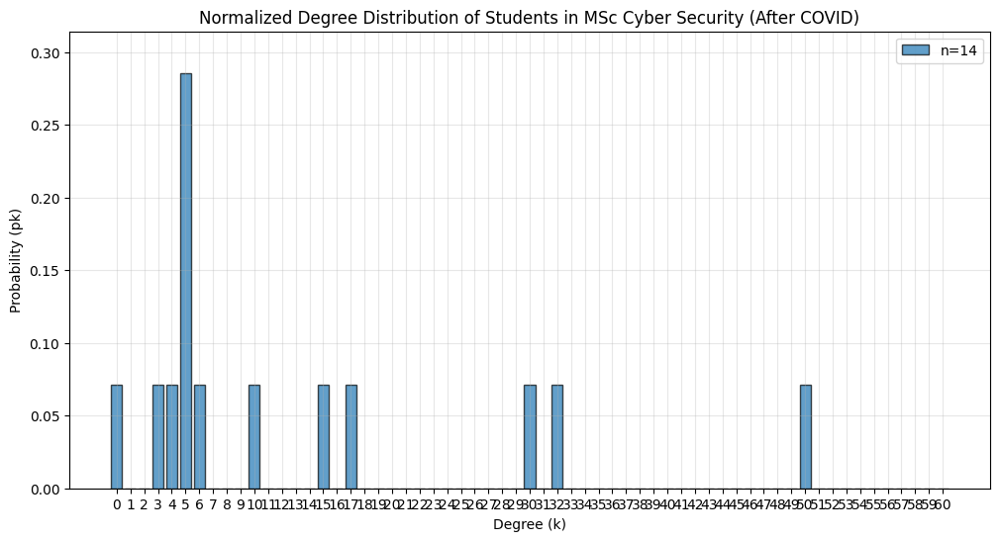

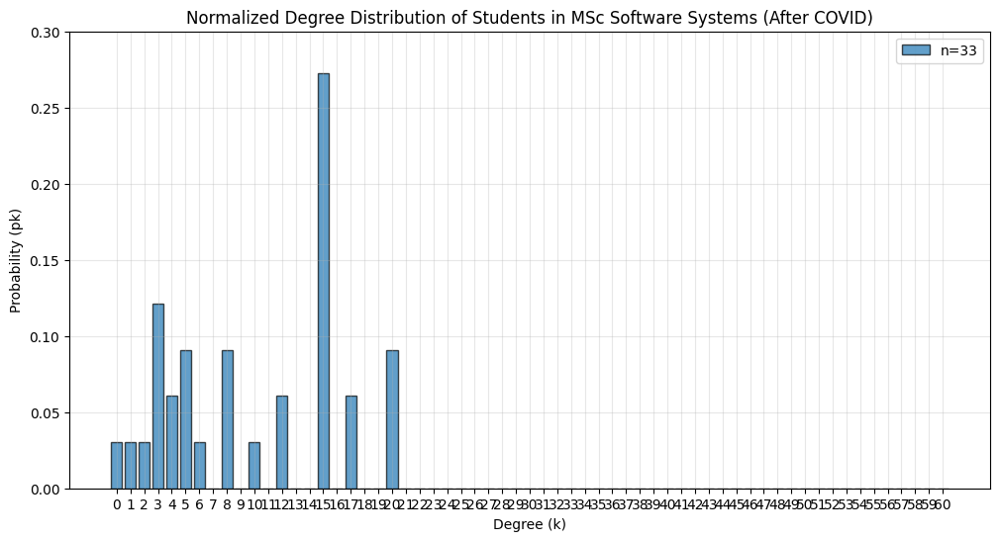

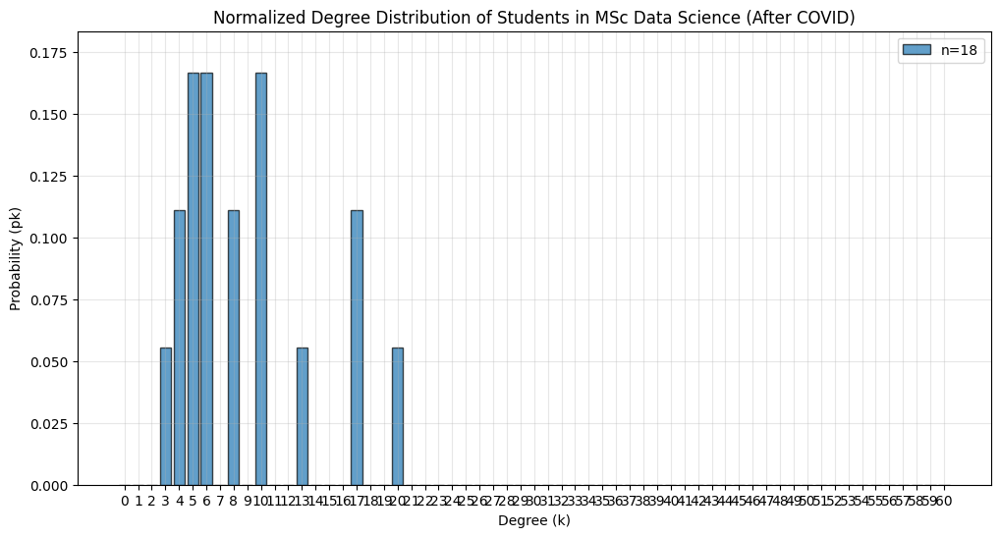

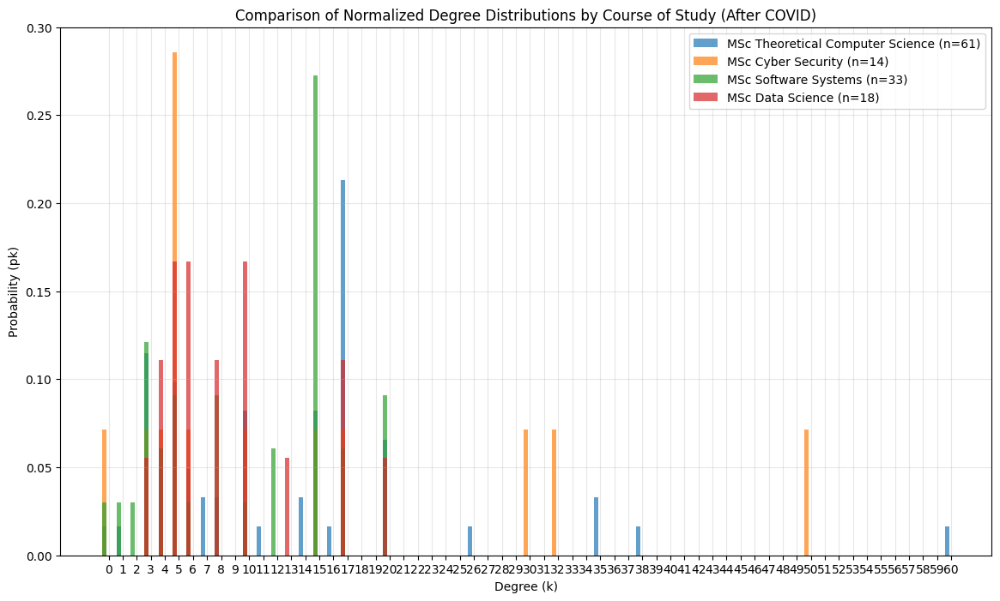

In [ ]:
#NORMALISED DEGREE DISTRIBUTION - BASED ON COURSE(AFTER COVID)

# Step 1: Calculate degrees and separate by course of study after COVID
degrees_after_covid = {n: student_graph_after_covid.degree(n) for n in student_graph_after_covid.nodes()}
course_degrees_after_covid = {}

for node, attrs in student_graph_after_covid.nodes(data=True):
    course = attrs['Course of Study']  # Assuming 'Course of Study' is the attribute name
    if course not in course_degrees_after_covid:
        course_degrees_after_covid[course] = []
    course_degrees_after_covid[course].append(degrees_after_covid[node])

# Step 2: Calculate degree distributions by course of study
max_degree_after_covid = max(degrees_after_covid.values())
degree_range_after_covid = range(max_degree_after_covid + 1)

# Function to calculate degree distribution (probability)
def calculate_pk(degree_list):
    n_total = len(degree_list)
    if n_total == 0:
        return [0] * (max_degree_after_covid + 1)

    # Count nodes with each degree
    degree_counts = {}
    for d in degree_range_after_covid:
        degree_counts[d] = degree_list.count(d)

    # Calculate probability pk = Nk/N
    pk_values = [degree_counts.get(d, 0) / n_total for d in degree_range_after_covid]
    return pk_values

# Calculate pk for each course of study
pk_courses_after_covid = {}
for course, degrees in course_degrees_after_covid.items():
    pk_courses_after_covid[course] = calculate_pk(degrees)

# Step 3: Plotting normalized degree distributions for each course of study after COVID
for course, pk_values in pk_courses_after_covid.items():
    plt.figure(figsize=(12, 6))
    plt.bar(degree_range_after_covid, pk_values, alpha=0.7, edgecolor='black', width=0.8,
            label=f"n={len(course_degrees_after_covid[course])}")
    plt.title(f'Normalized Degree Distribution of Students in {course} (After COVID)')
    plt.xlabel('Degree (k)')
    plt.ylabel('Probability (pk)')
    plt.xticks(degree_range_after_covid)
    plt.ylim(0, max(pk_values) * 1.1)  # Add some padding
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

# Optional: Plot all distributions together for comparison
plt.figure(figsize=(14, 8))
for course, pk_values in pk_courses_after_covid.items():
    plt.bar([x - 0.3 for x in degree_range_after_covid], pk_values, alpha=0.7, width=0.3,
            label=f"{course} (n={len(course_degrees_after_covid[course])})")
plt.title('Comparison of Normalized Degree Distributions by Course of Study (After COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_after_covid)
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [ ]:
import numpy as np
from scipy.stats import pearsonr

# Create a common degree range that includes all possible degrees
max_degree = max(max(degree_range_before_covid), max(degree_range_during_covid), max(degree_range_after_covid))
common_degree_range = range(max_degree + 1)

# Function to align pk values to a common degree range
def align_pk_to_common_range(pk_values, common_range):
    aligned_pk = [0] * (max(common_range) + 1)  # Initialize with zeros
    for degree, pk in zip(range(len(pk_values)), pk_values):
        aligned_pk[degree] = pk  # Fill in the pk values at the corresponding degree
    return aligned_pk

# Align pk values for each course of study before, during, and after COVID
pk_courses_before_aligned = {course: align_pk_to_common_range(pk_courses_before_covid[course], common_degree_range) for course in pk_courses_before_covid}
pk_courses_during_aligned = {course: align_pk_to_common_range(pk_courses_during_covid[course], common_degree_range) for course in pk_courses_during_covid}
pk_courses_after_aligned = {course: align_pk_to_common_range(pk_courses_after_covid[course], common_degree_range) for course in pk_courses_after_covid}

# Calculate correlation coefficients for each course of study
correlation_courses = {}
for course in pk_courses_before_covid.keys():
    correlation_before_during = pearsonr(pk_courses_before_aligned[course], pk_courses_during_aligned[course])[0]
    correlation_during_after = pearsonr(pk_courses_during_aligned[course], pk_courses_after_aligned[course])[0]
    correlation_before_after = pearsonr(pk_courses_before_aligned[course], pk_courses_after_aligned[course])[0]

    correlation_courses[course] = {
        'Before vs During': correlation_before_during,
        'During vs After': correlation_during_after,
        'Before vs After': correlation_before_after
    }

# Print the correlation coefficients for each course of study
for course, correlations in correlation_courses.items():
    print(f"Course of Study: {course}")
    print(f"  Correlation coefficient (Before vs During): {correlations['Before vs During']:.4f}")
    print(f"  Correlation coefficient (During vs After): {correlations['During vs After']:.4f}")
    print(f"  Correlation coefficient (Before vs After): {correlations['Before vs After']:.4f}")
    print()

Course of Study: MSc Theoretical Computer Science
  Correlation coefficient (Before vs During): 0.5388
  Correlation coefficient (During vs After): 0.4333
  Correlation coefficient (Before vs After): 0.8567

Course of Study: MSc Cyber Security
  Correlation coefficient (Before vs During): 0.7147
  Correlation coefficient (During vs After): 0.6180
  Correlation coefficient (Before vs After): 0.6050

Course of Study: MSc Software Systems
  Correlation coefficient (Before vs During): 0.3946
  Correlation coefficient (During vs After): 0.2903
  Correlation coefficient (Before vs After): 0.4098

Course of Study: MSc Data Science
  Correlation coefficient (Before vs During): 0.7926
  Correlation coefficient (During vs After): 0.6080
  Correlation coefficient (Before vs After): 0.5974



In [ ]:
#Finding the influential nodes in a network (BEFORE COVID)


#DEGREE CENTRALITY

degree_centrality = nx.degree_centrality(student_graph_before_covid)
most_influential_degree = max(degree_centrality, key=degree_centrality.get)

print("MOST INFLUENTIAL NODE - USING DEGREE CENTRALITY:")
print(f"Name:",most_influential_degree)
degree_node_properties = student_graph_before_covid.nodes[most_influential_degree]
print(f"Degree Centrality:", degree_centrality[most_influential_degree])
print(f"Year of study:", degree_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

#BETWEENNESS CENTRALITY

betweenness_centrality = nx.betweenness_centrality(student_graph_before_covid)
most_influential_betweenness = max(betweenness_centrality, key=betweenness_centrality.get)

print("MOST INFLUENTIAL NODE - USING BETWEENNESS CENTRALITY:")
print(f"Name:",most_influential_betweenness)
betweenness_node_properties = student_graph_before_covid.nodes[most_influential_betweenness]
print(f"Betweenness Centrality:", betweenness_centrality[most_influential_betweenness])
print(f"Year of study:", betweenness_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

#CLOSENESS CENTRALITY

closeness_centrality = nx.closeness_centrality(student_graph_before_covid)
most_influential_closeness = max(closeness_centrality, key=closeness_centrality.get)

print("MOST INFLUENTIAL NODE - USING CLOSENESS CENTRALITY:")
print(f"Name:",most_influential_closeness)
closeness_node_properties = student_graph_before_covid.nodes[most_influential_closeness]
print(f"Closeness Centrality:", closeness_centrality[most_influential_closeness])
print(f"Year of study:", closeness_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")



#EIGEN VECTOR CENTRALITY

eigenvector_centrality = nx.eigenvector_centrality(student_graph_before_covid)
most_influential_eigenvector = max(eigenvector_centrality, key=eigenvector_centrality.get)

print("MOST INFLUENTIAL NODE - USING EIGEN VECTOR CENTRALITY:")
print(f"Name:",most_influential_eigenvector)
eigenvector_node_properties = student_graph_before_covid.nodes[most_influential_eigenvector]
print(f"Eigen vector Centrality:", eigenvector_centrality[most_influential_eigenvector])
print(f"Year of study:", eigenvector_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")


# PAGERANK CENTRALITY

pagerank_centrality = nx.pagerank(student_graph_before_covid)
most_influential_pagerank = max(pagerank_centrality, key=pagerank_centrality.get)

print("MOST INFLUENTIAL NODE - USING PAGERANK CENTRALITY:")
print(f"Name:",most_influential_pagerank)
pagerank_node_properties = student_graph_before_covid.nodes[most_influential_pagerank]
print(f"Pagerank Centrality:", pagerank_centrality[most_influential_pagerank])
print(f"Year of study:", pagerank_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")



MOST INFLUENTIAL NODE - USING DEGREE CENTRALITY:
Name: Student1
Degree Centrality: 0.32
Year of study: 2019-24


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING BETWEENNESS CENTRALITY:
Name: Student11
Betweenness Centrality: 0.09364836654206574
Year of study: 2021-26


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING CLOSENESS CENTRALITY:
Name: Student11
Closeness Centrality: 0.5541890547263681
Year of study: 2021-26


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING EIGEN VECTOR CENTRALITY:
Name: Student1
Eigen vector Centrality: 0.2061817610807332
Year of study: 2019-24


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING PAGERANK CENTRALITY:
Name: Student9
Pagerank Centrality: 0.02849724838319042
Year of study: 2021-26


-------------------------------------------

In [ ]:
# Finding the influential nodes in a network (DURING COVID)

# DEGREE CENTRALITY
degree_centrality = nx.degree_centrality(student_graph_during_covid)
most_influential_degree = max(degree_centrality, key=degree_centrality.get)

print("MOST INFLUENTIAL NODE - USING DEGREE CENTRALITY:")
print(f"Name:", most_influential_degree)
degree_node_properties = student_graph_during_covid.nodes[most_influential_degree]
print(f"Degree Centrality:", degree_centrality[most_influential_degree])
print(f"Year of study:", degree_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# BETWEENNESS CENTRALITY
betweenness_centrality = nx.betweenness_centrality(student_graph_during_covid)
most_influential_betweenness = max(betweenness_centrality, key=betweenness_centrality.get)

print("MOST INFLUENTIAL NODE - USING BETWEENNESS CENTRALITY:")
print(f"Name:", most_influential_betweenness)
betweenness_node_properties = student_graph_during_covid.nodes[most_influential_betweenness]
print(f"Betweenness Centrality:", betweenness_centrality[most_influential_betweenness])
print(f"Year of study:", betweenness_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# CLOSENESS CENTRALITY
closeness_centrality = nx.closeness_centrality(student_graph_during_covid)
most_influential_closeness = max(closeness_centrality, key=closeness_centrality.get)

print("MOST INFLUENTIAL NODE - USING CLOSENESS CENTRALITY:")
print(f"Name:", most_influential_closeness)
closeness_node_properties = student_graph_during_covid.nodes[most_influential_closeness]
print(f"Closeness Centrality:", closeness_centrality[most_influential_closeness])
print(f"Year of study:", closeness_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# EIGEN VECTOR CENTRALITY
eigenvector_centrality = nx.eigenvector_centrality(student_graph_during_covid)
most_influential_eigenvector = max(eigenvector_centrality, key=eigenvector_centrality.get)

print("MOST INFLUENTIAL NODE - USING EIGEN VECTOR CENTRALITY:")
print(f"Name:", most_influential_eigenvector)
eigenvector_node_properties = student_graph_during_covid.nodes[most_influential_eigenvector]
print(f"Eigen vector Centrality:", eigenvector_centrality[most_influential_eigenvector])
print(f"Year of study:", eigenvector_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# PAGERANK CENTRALITY
pagerank_centrality = nx.pagerank(student_graph_during_covid)
most_influential_pagerank = max(pagerank_centrality, key=pagerank_centrality.get)

print("MOST INFLUENTIAL NODE - USING PAGERANK CENTRALITY:")
print(f"Name:", most_influential_pagerank)
pagerank_node_properties = student_graph_during_covid.nodes[most_influential_pagerank]
print(f"Pagerank Centrality:", pagerank_centrality[most_influential_pagerank])
print(f"Year of study:", pagerank_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

MOST INFLUENTIAL NODE - USING DEGREE CENTRALITY:
Name: Student6
Degree Centrality: 0.304
Year of study: 2021-26


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING BETWEENNESS CENTRALITY:
Name: Student6
Betweenness Centrality: 0.18978460542470474
Year of study: 2021-26


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING CLOSENESS CENTRALITY:
Name: Student6
Closeness Centrality: 0.5348310502283105
Year of study: 2021-26


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING EIGEN VECTOR CENTRALITY:
Name: Student6
Eigen vector Centrality: 0.3294887897329927
Year of study: 2021-26


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING PAGERANK CENTRALITY:
Name: Student6
Pagerank Centrality: 0.03977096607991636
Year of study: 2021-26


--------------------------------------------

In [ ]:
# Finding the influential nodes in a network (AFTER COVID)

# DEGREE CENTRALITY
degree_centrality = nx.degree_centrality(student_graph_after_covid)
most_influential_degree = max(degree_centrality, key=degree_centrality.get)

print("MOST INFLUENTIAL NODE - USING DEGREE CENTRALITY:")
print(f"Name:", most_influential_degree)
degree_node_properties = student_graph_after_covid.nodes[most_influential_degree]
print(f"Degree Centrality:", degree_centrality[most_influential_degree])
print(f"Year of study:", degree_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# BETWEENNESS CENTRALITY
betweenness_centrality = nx.betweenness_centrality(student_graph_after_covid)
most_influential_betweenness = max(betweenness_centrality, key=betweenness_centrality.get)

print("MOST INFLUENTIAL NODE - USING BETWEENNESS CENTRALITY:")
print(f"Name:", most_influential_betweenness)
betweenness_node_properties = student_graph_after_covid.nodes[most_influential_betweenness]
print(f"Betweenness Centrality:", betweenness_centrality[most_influential_betweenness])
print(f"Year of study:", betweenness_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# CLOSENESS CENTRALITY
closeness_centrality = nx.closeness_centrality(student_graph_after_covid)
most_influential_closeness = max(closeness_centrality, key=closeness_centrality.get)

print("MOST INFLUENTIAL NODE - USING CLOSENESS CENTRALITY:")
print(f"Name:", most_influential_closeness)
closeness_node_properties = student_graph_after_covid.nodes[most_influential_closeness]
print(f"Closeness Centrality:", closeness_centrality[most_influential_closeness])
print(f"Year of study:", closeness_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# EIGEN VECTOR CENTRALITY
eigenvector_centrality = nx.eigenvector_centrality(student_graph_after_covid)
most_influential_eigenvector = max(eigenvector_centrality, key=eigenvector_centrality.get)

print("MOST INFLUENTIAL NODE - USING EIGEN VECTOR CENTRALITY:")
print(f"Name:", most_influential_eigenvector)
eigenvector_node_properties = student_graph_after_covid.nodes[most_influential_eigenvector]
print(f"Eigen vector Centrality:", eigenvector_centrality[most_influential_eigenvector])
print(f"Year of study:", eigenvector_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# PAGERANK CENTRALITY
pagerank_centrality = nx.pagerank(student_graph_after_covid)
most_influential_pagerank = max(pagerank_centrality, key=pagerank_centrality.get)

print("MOST INFLUENTIAL NODE - USING PAGERANK CENTRALITY:")
print(f"Name:", most_influential_pagerank)
pagerank_node_properties = student_graph_after_covid.nodes[most_influential_pagerank]
print(f"Pagerank Centrality:", pagerank_centrality[most_influential_pagerank])
print(f"Year of study:", pagerank_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

MOST INFLUENTIAL NODE - USING DEGREE CENTRALITY:
Name: Student1
Degree Centrality: 0.48
Year of study: 2019-24


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING BETWEENNESS CENTRALITY:
Name: Student1
Betweenness Centrality: 0.16688085367901145
Year of study: 2019-24


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING CLOSENESS CENTRALITY:
Name: Student1
Closeness Centrality: 0.6300105820105819
Year of study: 2019-24


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING EIGEN VECTOR CENTRALITY:
Name: Student1
Eigen vector Centrality: 0.2898315564467145
Year of study: 2019-24


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING PAGERANK CENTRALITY:
Name: Student1
Pagerank Centrality: 0.0394487997599045
Year of study: 2019-24


----------------------------------------------

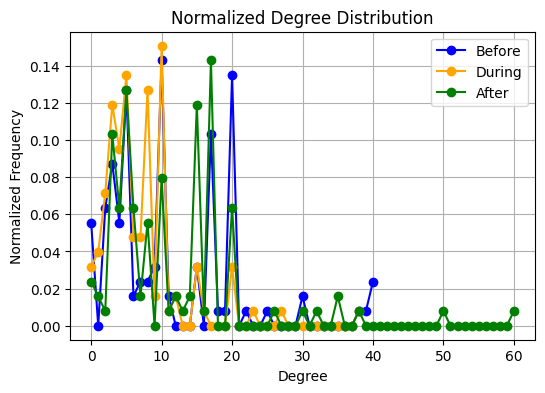

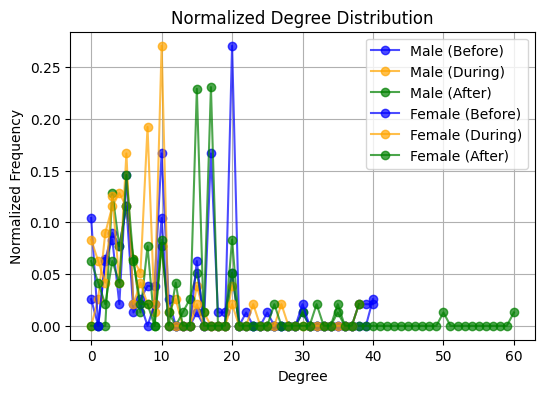

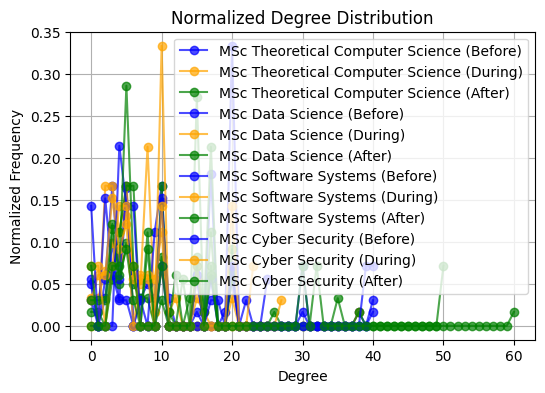

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

# Function to compute normalized degree distribution
def compute_normalized_degree_distribution(graph, nodes=None):
    if nodes is None:
        nodes = list(graph.nodes())
    degrees = [graph.degree(n) for n in nodes]
    if not degrees:
        return np.array([]), np.array([])
    max_degree = max(degrees)
    hist, bins = np.histogram(degrees, bins=range(max_degree + 2), density=True)
    return hist, bins[:-1]

# Function to plot combined normalized degree distributions
def plot_combined_degree_distribution(graphs, titles, filename, segment_by=None, segment_values=None, colors=None):
    plt.figure(figsize=(6, 4))
    period_colors = ['blue', 'orange', 'green']  # Colors for Before, During, After
    if segment_by is None:  # Overall degree distribution
        for graph, title, color in zip(graphs, titles, period_colors):
            hist, bins = compute_normalized_degree_distribution(graph)
            if len(hist) > 0:
                plt.plot(bins, hist, marker='o', linestyle='-', color=color, label=title)
    else:  # Segmented degree distribution
        for value, color in zip(segment_values, colors):
            for graph, title, period_color in zip(graphs, titles, period_colors):
                nodes = [n for n in graph.nodes() if graph.nodes[n][segment_by] == value]
                hist, bins = compute_normalized_degree_distribution(graph, nodes)
                if len(hist) > 0:
                    plt.plot(bins, hist, marker='o', linestyle='-', color=period_color,
                             label=f"{value} ({title})", alpha=0.7)
    plt.title("Normalized Degree Distribution")
    plt.xlabel("Degree")
    plt.ylabel("Normalized Frequency")
    plt.legend()
    plt.grid(True)
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Graphs and titles for the three periods
graphs = [student_graph_before_covid, student_graph_during_covid, student_graph_after_covid]
period_titles = ['Before', 'During', 'After']

# Overall degree distributions (combined)
plot_combined_degree_distribution(graphs, period_titles, "degree_dist_overall_combined.png")

# Degree distributions segmented by gender (combined)
gender_values = ['Male', 'Female']
gender_colors = ['skyblue', 'pink']
plot_combined_degree_distribution(graphs, period_titles, "degree_dist_gender_combined.png",
                                 segment_by='Gender', segment_values=gender_values, colors=gender_colors)

# Degree distributions segmented by course of study (combined)
course_values = ['MSc Theoretical Computer Science', 'MSc Data Science', 'MSc Software Systems', 'MSc Cyber Security']
course_colors = ['blue', 'red', 'green', 'brown']
plot_combined_degree_distribution(graphs, period_titles, "degree_dist_course_combined.png",
                                 segment_by='Course of Study', segment_values=course_values, colors=course_colors)